In [1]:
#Saving all files 

In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import holoviews as hv
import hvplot.pandas
from statsmodels.tsa.seasonal import seasonal_decompose

In [3]:
data = pd.read_csv('VenueDailyVisitors.csv', index_col=0)

In [4]:
data.head()

,BGW,MAJ,QHZ,VIY,VUV,NMN,WUC,DAT,NSY,VOK,...,ZOZ,AOJ,NGD,BAL,MGT,TNB,EUI,UAF,SHI,DGG
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,103,202,78,242,0,584,204,86,297,212,...,79,55,597,77,323,0,97,0,0,65
2023-01-02,87,164,80,163,0,603,188,89,245,207,...,94,66,588,60,233,0,85,0,0,61
2023-01-03,62,155,84,153,0,431,144,93,186,105,...,79,81,466,62,246,0,79,0,0,62
2023-01-04,70,181,88,140,0,423,101,84,168,159,...,89,84,456,49,249,0,89,0,0,68
2023-01-05,65,166,79,140,0,471,104,82,183,119,...,84,77,410,64,203,0,99,0,0,63


In [5]:
data.describe()

,BGW,MAJ,QHZ,VIY,VUV,NMN,WUC,DAT,NSY,VOK,...,ZOZ,AOJ,NGD,BAL,MGT,TNB,EUI,UAF,SHI,DGG
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,...,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,79.210959,203.972603,79.991781,178.515068,35.791781,462.920548,153.057534,90.008219,233.345205,169.657534,...,89.638356,79.484932,503.194521,64.002740,261.101370,30.191781,90.728767,10.931507,19.438356,63.008219
std,13.997915,46.903271,5.365994,41.437467,31.370096,101.161289,36.237229,6.837794,49.452622,43.036089,...,10.339068,9.470772,78.484078,6.573966,47.760657,56.181627,5.514254,25.498938,25.188403,4.519486
min,42.000000,98.000000,63.000000,83.000000,0.000000,192.000000,89.000000,71.000000,105.000000,49.000000,...,63.000000,52.000000,318.000000,43.000000,146.000000,0.000000,76.000000,0.000000,0.000000,53.000000
25%,69.000000,168.000000,76.000000,147.000000,0.000000,397.000000,116.000000,86.000000,198.000000,139.000000,...,82.000000,73.000000,443.000000,60.000000,227.000000,0.000000,87.000000,0.000000,0.000000,60.000000
50%,79.000000,204.000000,80.000000,177.000000,37.000000,458.000000,145.000000,90.000000,235.000000,173.000000,...,90.000000,80.000000,500.000000,64.000000,258.000000,0.000000,91.000000,0.000000,0.000000,63.000000
75%,88.000000,240.000000,83.000000,211.000000,58.000000,540.000000,188.000000,95.000000,270.000000,205.000000,...,97.000000,87.000000,565.000000,68.000000,297.000000,36.000000,95.000000,0.000000,36.000000,66.000000
max,116.000000,326.000000,97.000000,279.000000,115.000000,792.000000,220.000000,113.000000,356.000000,297.000000,...,119.000000,104.000000,702.000000,83.000000,401.000000,268.000000,105.000000,122.000000,88.000000,78.000000


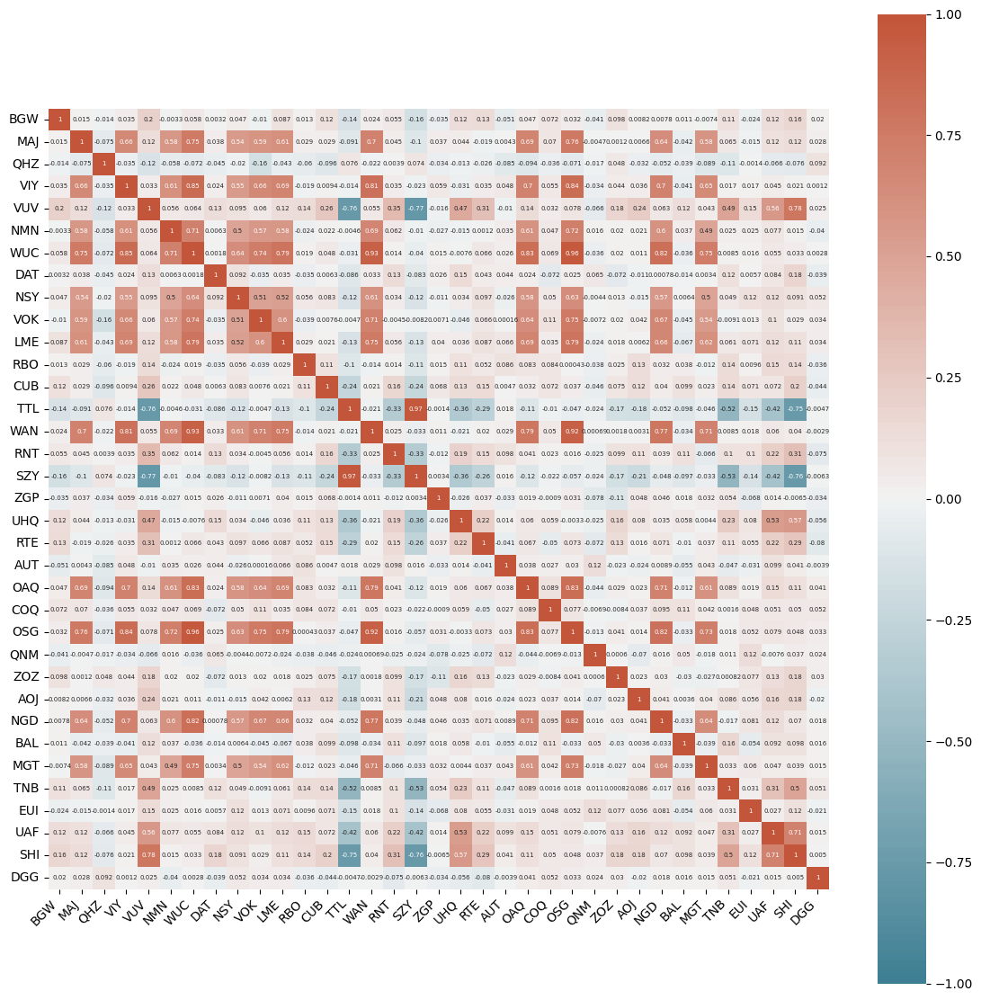

In [6]:
#corelation for branches
import seaborn as sns
plt.figure(figsize=(14, 14))
corr = data.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True,annot=True,annot_kws={"size": 5})
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

In [7]:
data.index = pd.to_datetime(data.index)

In [8]:
data.head()

,BGW,MAJ,QHZ,VIY,VUV,NMN,WUC,DAT,NSY,VOK,...,ZOZ,AOJ,NGD,BAL,MGT,TNB,EUI,UAF,SHI,DGG
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,103,202,78,242,0,584,204,86,297,212,...,79,55,597,77,323,0,97,0,0,65
2023-01-02,87,164,80,163,0,603,188,89,245,207,...,94,66,588,60,233,0,85,0,0,61
2023-01-03,62,155,84,153,0,431,144,93,186,105,...,79,81,466,62,246,0,79,0,0,62
2023-01-04,70,181,88,140,0,423,101,84,168,159,...,89,84,456,49,249,0,89,0,0,68
2023-01-05,65,166,79,140,0,471,104,82,183,119,...,84,77,410,64,203,0,99,0,0,63


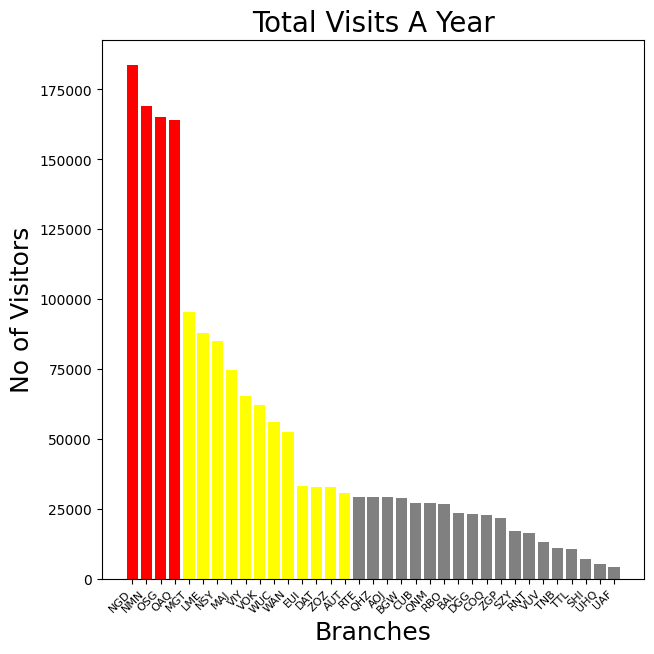

In [110]:
data = data.reindex(data.sum().sort_values(ascending=False).index, axis=1)
segment_colours = {
    'High': ['NGD', 'NMN', 'OSG', 'OAQ'],
    'Medium': ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT'],
    'Low': ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']
}
color_map = {'High': 'red', 'Medium': 'yellow', 'Low': 'gray'}

plt.figure(figsize=(7, 7))
x_pos = np.arange(len(data.columns))

bar_colors = []
for col in data.columns:
    if col in segment_colours['High']:
        bar_colors.append(color_map['High'])
    elif col in segment_colours['Medium']:
        bar_colors.append(color_map['Medium'])
    else:  # Low category defaults to gray
        bar_colors.append(color_map['Low'])
        
plt.bar(x_pos, data.sum(),color=bar_colors, align='center')
plt.xticks(x_pos, data.columns,rotation=45, ha='right', fontsize=8)
plt.xlabel('Branches', fontsize=18)
plt.ylabel('No of Visitors', fontsize=18)
plt.title('Total Visits A Year', fontsize=20)
plt.show()

High: ['NGD', 'NMN', 'OSG', 'OAQ']
Medium: ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']
Low: ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']


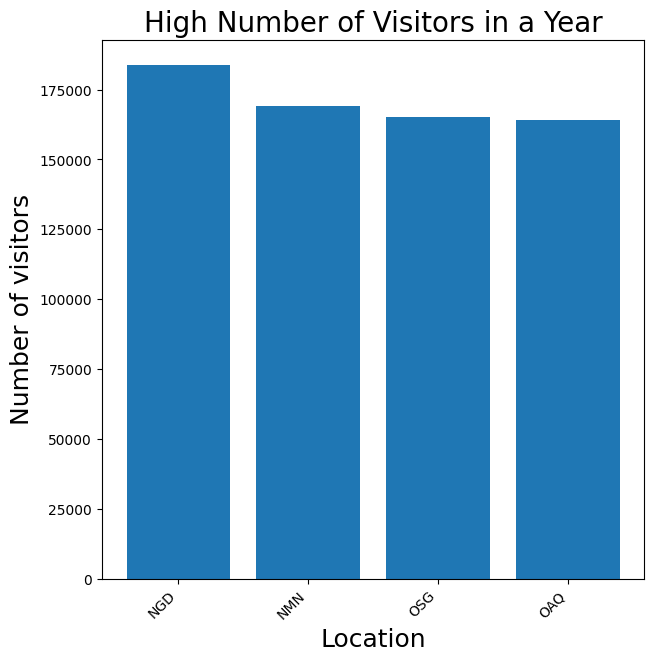

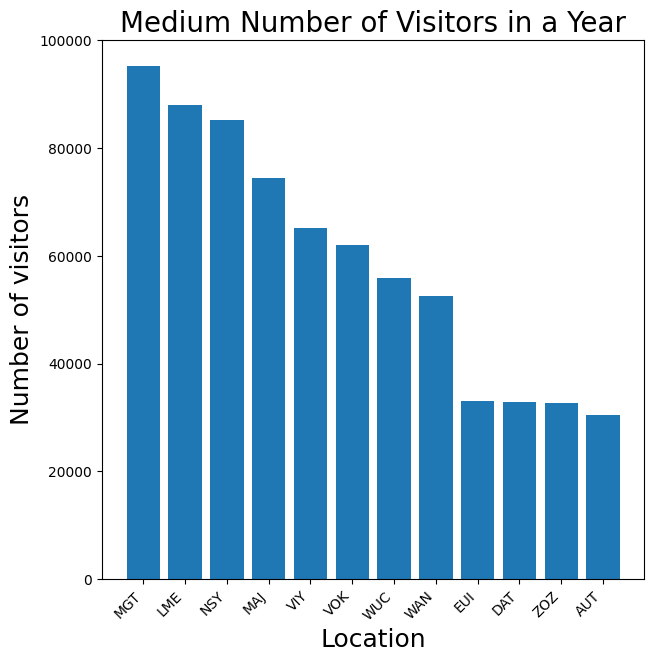

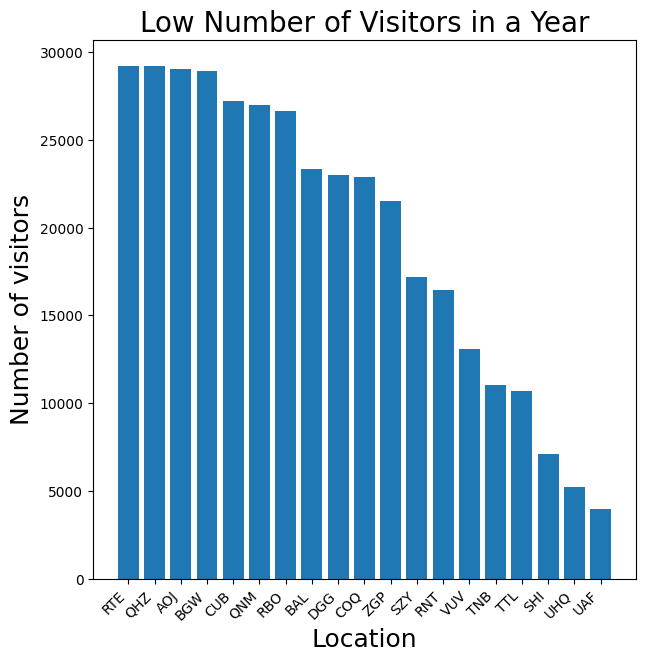

In [10]:
data = data.reindex(data.sum().sort_values(ascending=False).index, axis=1)
segment_limits = {
    0: 'Low',
    30_000: 'Medium',
    100_000: 'High',
}
segments = {}
limits = list(segment_limits.keys())
for i in range(len(limits)):
    if i < len(limits) - 1:
        included = (limits[i] <= data.sum()) & (data.sum() < limits[i + 1]) 
    else:
        included = (limits[i] <= data.sum()) 
    segment_name = segment_limits[limits[i]]
    segment_columns = data.columns[included]
    segments[segment_name] = list(segment_columns)

for segment_name in reversed(segments):
    print(f'{segment_name}: {segments[segment_name]}')

for segment_name in reversed(segments):
    selected = segments[segment_name]
    plt.figure(figsize=(7, 7))
    x_pos = np.arange(len(data[selected].columns))
    plt.bar(x_pos, data[selected].sum(), align='center')
    plt.xticks(x_pos, data[selected].columns,rotation=45, ha='right', fontsize=10)
    plt.xlabel('Location', fontsize=18)
    plt.ylabel('Number of visitors', fontsize=18)
    plt.title(segment_name + ' Number of Visitors in a Year', fontsize=20)
    plt.show()

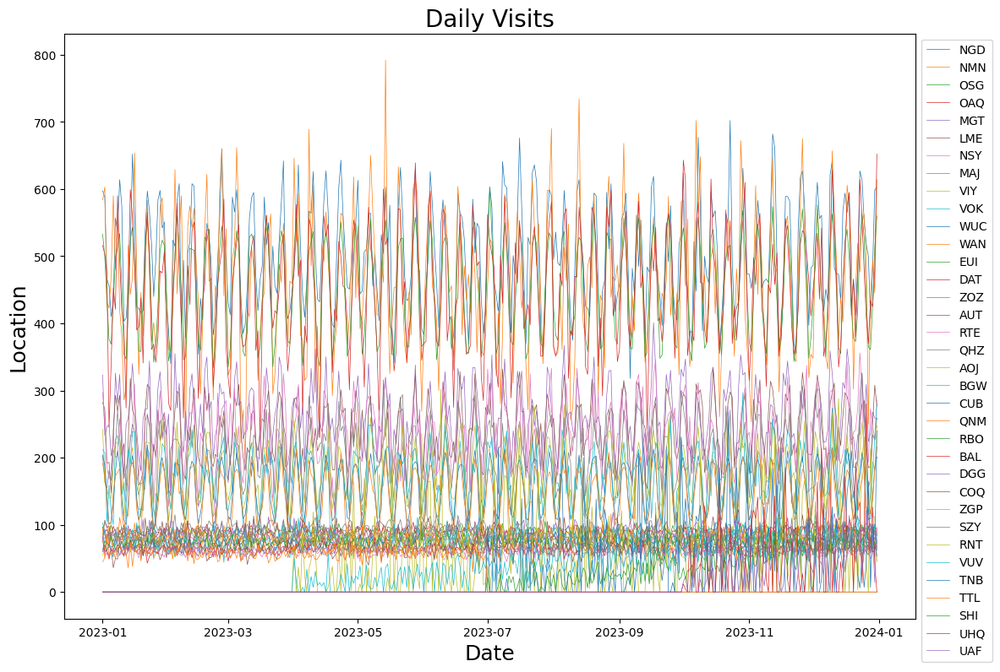

In [11]:
# data.plot.line(linewidth=0.5, figsize=(7, 7))

plt.figure(figsize=(13, 9))

for segment, locations in segment_colours.items():
    for location in locations:
        if location in data.columns:
         plt.plot(data[location], linewidth=0.5,label=location)

plt.xlabel('Date', fontsize=18)
plt.ylabel('Location', fontsize=18)
plt.title('Daily Visits', fontsize=20)

# Move legend outside the plot
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

In [12]:
column_sum = data.select_dtypes(include='number').sum()

In [13]:
column_sum

NGD    183666
NMN    168966
OSG    165262
OAQ    164048
MGT     95302
LME     87941
NSY     85171
MAJ     74450
VIY     65158
VOK     61925
WUC     55866
WAN     52522
EUI     33116
DAT     32853
ZOZ     32718
AUT     30476
RTE     29226
QHZ     29197
AOJ     29012
BGW     28912
CUB     27193
QNM     26983
RBO     26664
BAL     23361
DGG     22998
COQ     22907
ZGP     21520
SZY     17190
RNT     16445
VUV     13064
TNB     11020
TTL     10722
SHI      7095
UHQ      5257
UAF      3990
dtype: int64

In [14]:
sum_col = pd.DataFrame(column_sum, columns = ['Visits_per_year'])

In [15]:
sum_col

,Visits_per_year
NGD,183666
NMN,168966
OSG,165262
OAQ,164048
MGT,95302
LME,87941
NSY,85171
MAJ,74450
VIY,65158
VOK,61925


In [16]:
sum_col.to_csv('Venue_sum_visitors.csv')

In [17]:
#import .csv files to summarize data into one dataframe. 
daily_visitors = pd.read_csv('Venue_sum_visitors.csv',index_col=0)
age = pd.read_csv('VenueAge.csv',index_col=0)
distance = pd.read_csv('VenueDistance.csv',index_col=0)
duration = pd.read_csv('VenueDuration.csv',index_col=0)
gender = pd.read_csv('VenueGender.csv',index_col=0)
spend = pd.read_csv('VenueSpend.csv',index_col=0)

In [18]:
#create empty dataframe
summary_data = pd.DataFrame(index=data.columns)

In [19]:
#each venue file should have summary data
summary_data['visitors_per_yr'] = daily_visitors.values
summary_data['Avg_age'] = age.values
summary_data['max_trvl_distance'] = distance.values
summary_data['avg_visit_duration'] = duration.values 
summary_data['gender_female_%'] = gender.values
summary_data['avg_spend'] = spend.values

In [20]:
summary_data

,visitors_per_yr,Avg_age,max_trvl_distance,avg_visit_duration,gender_female_%,avg_spend
NGD,183666,54,10,92,42,29
NMN,168966,21,20,85,54,10
OSG,165262,25,13,104,57,14
OAQ,164048,50,22,132,53,22
MGT,95302,45,5,108,45,18
LME,87941,39,40,138,54,22
NSY,85171,46,18,96,53,18
MAJ,74450,47,6,65,45,17
VIY,65158,36,32,82,55,17
VOK,61925,37,11,93,47,16


In [21]:
df = pd.DataFrame(summary_data)
df.to_csv('summary_data.csv', index=False) 

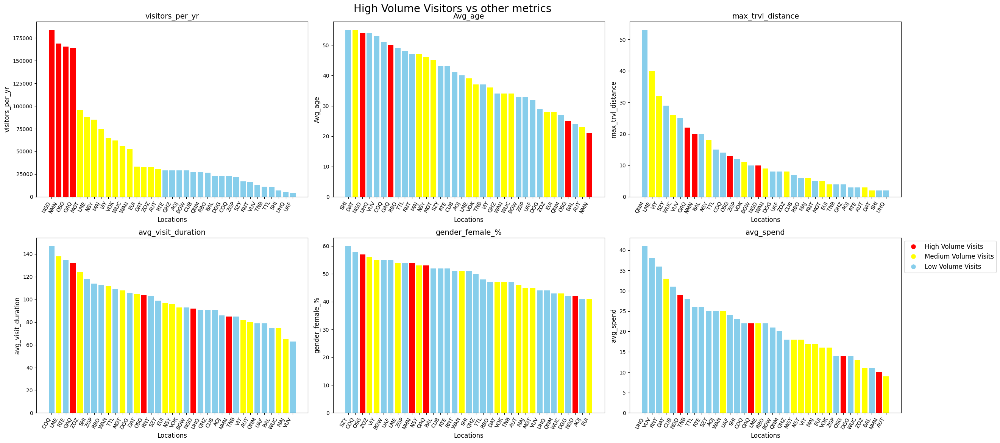

In [22]:
plt.figure(figsize=(24, 17))
fig = plt.gcf()  # Get current figure
fig.suptitle('High Volume Visitors vs other metrics', fontsize=20)
plt.subplots_adjust(top=0.92, hspace=0.3)
counter = 1

# Define segment colors
segment_colours = {
    'High': ['NGD', 'NMN', 'OSG', 'OAQ'],
    'Medium': ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT'],
    'Low': ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']
}
color_map = {'High': 'red', 'Medium': 'yellow', 'Low': 'skyblue'}

# Precompute bar colors once based on original order
original_bar_colors = []
for col in data.columns:
    if col in segment_colours['High']:
        original_bar_colors.append(color_map['High'])
    elif col in segment_colours['Medium']:
        original_bar_colors.append(color_map['Medium'])
    else:
        original_bar_colors.append(color_map['Low'])

for attribute in summary_data:
    # Sort data in descending order
    sorted_data = summary_data[attribute].sort_values(ascending=False)
    
    # Get sorted x positions
    x_pos = np.arange(len(sorted_data.index))
    
    # Use the original bar colors (not rearranged)
    sorted_bar_colors = [original_bar_colors[data.columns.get_loc(col)] for col in sorted_data.index]

    # Create subplot
    sub = plt.subplot(3, 3, counter)
    sub.set_title(attribute, fontsize=14)
    sub.bar(x_pos, sorted_data, color=sorted_bar_colors, align='center')
    handles = [
    plt.Line2D([0], [0], marker='o', color='w', label='High Volume Visits', markerfacecolor='red', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Medium Volume Visits', markerfacecolor='yellow', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Low Volume Visits', markerfacecolor='Skyblue', markersize=10)
]
    
    # Set x-axis labels
    sub.set_xticks(x_pos)
    sub.set_xticklabels(sorted_data.index, rotation=60, ha='right', fontsize=10)
    
    # Labels
    sub.set_xlabel('Locations', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    
    counter += 1

plt.tight_layout()
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)

plt.savefig("All metrics final.png", dpi=300, bbox_inches="tight")
plt.show()

#create color codes for high medium and low. 

In [23]:
data.head()

,NGD,NMN,OSG,OAQ,MGT,LME,NSY,MAJ,VIY,VOK,...,COQ,ZGP,SZY,RNT,VUV,TNB,TTL,SHI,UHQ,UAF
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,597,584,533,516,323,282,297,202,242,212,...,62,63,95,0,0,0,45,0,0,0
2023-01-02,588,603,499,503,233,272,245,164,163,207,...,70,57,103,0,0,0,51,0,0,0
2023-01-03,466,431,434,475,246,192,186,155,153,105,...,58,56,98,0,0,0,82,0,0,0
2023-01-04,456,423,376,245,249,193,168,181,140,159,...,54,57,75,0,0,0,55,0,0,0
2023-01-05,410,471,369,341,203,147,183,166,140,119,...,66,58,89,0,0,0,56,0,0,0


In [24]:
data.tail()

,NGD,NMN,OSG,OAQ,MGT,LME,NSY,MAJ,VIY,VOK,...,COQ,ZGP,SZY,RNT,VUV,TNB,TTL,SHI,UHQ,UAF
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-27,500,250,365,370,224,185,193,157,134,116,...,55,62,0,0,97,165,0,67,69,72
2023-12-28,407,439,361,434,236,187,273,166,116,145,...,81,49,0,213,81,7,0,77,61,60
2023-12-29,482,494,427,425,268,249,248,234,194,180,...,59,57,0,113,69,101,0,66,126,85
2023-12-30,599,446,513,480,259,308,226,227,181,228,...,64,66,0,111,101,52,0,75,42,14
2023-12-31,602,614,560,652,257,277,286,259,248,281,...,67,67,0,45,72,240,0,54,0,94


In [25]:
data.describe()

,NGD,NMN,OSG,OAQ,MGT,LME,NSY,MAJ,VIY,VOK,...,COQ,ZGP,SZY,RNT,VUV,TNB,TTL,SHI,UHQ,UAF
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,...,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,503.194521,462.920548,452.772603,449.446575,261.101370,240.934247,233.345205,203.972603,178.515068,169.657534,...,62.758904,58.958904,47.095890,45.054795,35.791781,30.191781,29.375342,19.438356,14.402740,10.931507
std,78.484078,101.161289,70.323587,86.997445,47.760657,44.502637,49.452622,46.903271,41.437467,43.036089,...,9.134343,5.242573,47.993178,65.226758,31.370096,56.181627,30.247404,25.188403,39.498984,25.498938
min,318.000000,192.000000,334.000000,230.000000,146.000000,114.000000,105.000000,98.000000,83.000000,49.000000,...,35.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,443.000000,397.000000,378.000000,388.000000,227.000000,204.000000,198.000000,168.000000,147.000000,139.000000,...,57.000000,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,500.000000,458.000000,445.000000,450.000000,258.000000,241.000000,235.000000,204.000000,177.000000,173.000000,...,63.000000,59.000000,0.000000,0.000000,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,565.000000,540.000000,516.000000,518.000000,297.000000,276.000000,270.000000,240.000000,211.000000,205.000000,...,69.000000,62.000000,95.000000,73.000000,58.000000,36.000000,59.000000,36.000000,0.000000,0.000000
max,702.000000,792.000000,603.000000,652.000000,401.000000,332.000000,356.000000,326.000000,279.000000,297.000000,...,95.000000,73.000000,121.000000,302.000000,115.000000,268.000000,84.000000,88.000000,280.000000,122.000000


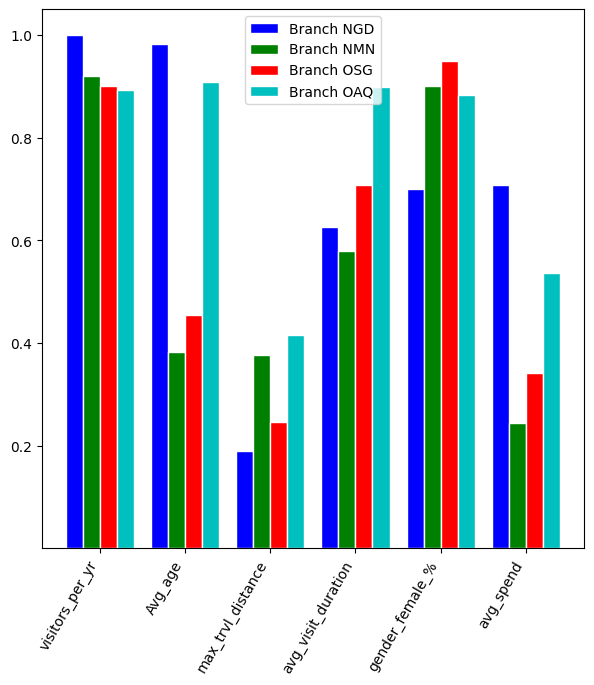

In [96]:
#plot for high volume branches
selected = ['NGD', 'NMN', 'OSG', 'OAQ'] 
normalised_data = summary_data / summary_data.max()
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(7, 7))
c = 0
n_bars = len(selected)
x_pos_base = np.arange(len(summary_data.columns))
bar_width = 0.8 / n_bars
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    x_pos = [x + (bar_width * c) for x in x_pos_base]
    plt.bar(x_pos, values, color=colours[c % len(colours)],
            width=bar_width, edgecolor='white', label='Branch ' + name)
    c += 1
plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0])
x_pos = [x + (bar_width * (c - 1) / 2) for x in x_pos_base]
plt.xticks(x_pos, summary_data.columns,rotation=60, ha='right', fontsize=10)
plt.legend()
plt.show()


In [97]:
data_second = pd.read_csv('VenueDailyVisitors.csv', index_col=0)
data_second.index = pd.to_datetime(data_second.index)

            NGD  NMN  OSG  OAQ  MGT  LME  NSY  MAJ  VIY  VOK  WUC  WAN  EUI  \
Date                                                                          
2023-01-01  597  584  533  516  323  282  297  202  242  212  204  192   97   
2023-01-02  588  603  499  503  233  272  245  164  163  207  188  172   85   
2023-01-03  466  431  434  475  246  192  186  155  153  105  144  140   79   
2023-01-04  456  423  376  245  249  193  168  181  140  159  101   75   89   
2023-01-05  410  471  369  341  203  147  183  166  140  119  104  105   99   

            DAT  ZOZ  AUT  Others  
Date                               
2023-01-01   86   79   79     958  
2023-01-02   89   94  107     925  
2023-01-03   93   79   96     950  
2023-01-04   84   89   98     876  
2023-01-05   82   84   80     933  


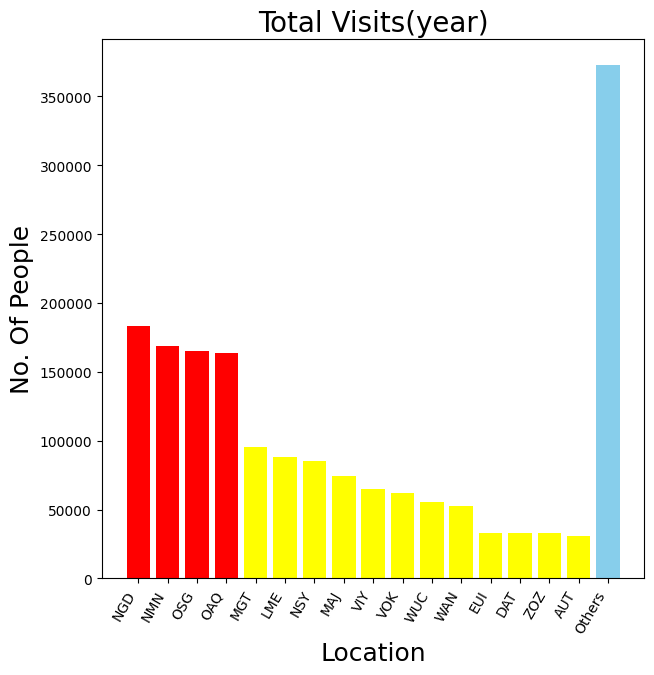

In [28]:
#Total visits a year, high and medium vs all bar chart
dataz = data_second.reindex(data_second.sum().sort_values(ascending=False).index, axis=1)

selected = []
columns = dataz.columns
dataz['Others'] = [0] * len(data.index)
for name in columns:
    total_visits = dataz[name].sum()
    if total_visits > 30000:
        selected.append(name)
    else:
        dataz['Others'] += dataz[name]
selected.append('Others')
print(dataz[selected].head())
color_map = {'High': 'red', 'Medium': 'yellow'}
bar_colors = []
for name in selected:
     if name == 'Others':  # Lock "Others" to skyblue
        bar_colors.append('skyblue')
     else:
        total_visit = dataz[name].sum()
        if total_visit > 100000:
            bar_colors.append(color_map['High'])  # High category -> red
        elif total_visit > 30000:  
            bar_colors.append(color_map['Medium'])  
        else:
            bar_colors.append('skyblue') 
plt.figure(figsize=(7, 7))
x_pos = np.arange(len(selected))
plt.bar(x_pos, dataz[selected].sum(), align='center', color=bar_colors)
plt.xticks(x_pos, selected,rotation=60, ha='right', fontsize=10)
plt.xlabel('Location', fontsize=18)
plt.ylabel('No. Of People', fontsize=18)
plt.title('Total Visits(year)', fontsize=20)
plt.show()

In [29]:
#checking..... delete later
selected = ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']

sum_of_low = data_second[selected].sum()
sum_of_all_low = sum_of_low.sum()

print(sum_of_all_low )                  

372756


In [30]:
# working on summary data......pointer
summary_data.head()

,visitors_per_yr,Avg_age,max_trvl_distance,avg_visit_duration,gender_female_%,avg_spend
NGD,183666,54,10,92,42,29
NMN,168966,21,20,85,54,10
OSG,165262,25,13,104,57,14
OAQ,164048,50,22,132,53,22
MGT,95302,45,5,108,45,18


In [31]:
#get total spend for a year (for each location) 
summary_data_two = summary_data.copy()
summary_data_two['total_spend'] = summary_data_two['visitors_per_yr'] * summary_data_two['avg_spend']


In [32]:
summary_data_two.head()

,visitors_per_yr,Avg_age,max_trvl_distance,avg_visit_duration,gender_female_%,avg_spend,total_spend
NGD,183666,54,10,92,42,29,5326314
NMN,168966,21,20,85,54,10,1689660
OSG,165262,25,13,104,57,14,2313668
OAQ,164048,50,22,132,53,22,3609056
MGT,95302,45,5,108,45,18,1715436


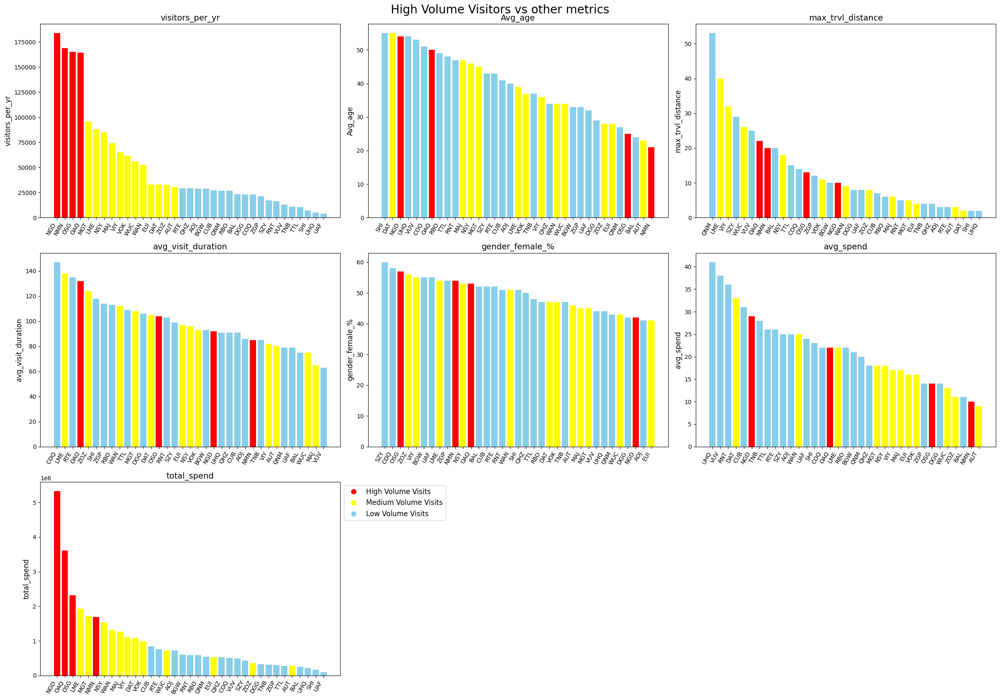

In [33]:
plt.figure(figsize=(24, 17))
fig = plt.gcf()  # Get current figure
fig.suptitle('High Volume Visitors vs other metrics', fontsize=20)
plt.subplots_adjust(top=0.92, hspace=0.3)
counter = 1
segment_colours = {
    'High': ['NGD', 'NMN', 'OSG', 'OAQ'],
    'Medium': ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT'],
    'Low': ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']
}
color_map = {'High': 'red', 'Medium': 'yellow', 'Low': 'skyblue'}

original_bar_colors = []
for col in data.columns:
    if col in segment_colours['High']:
        original_bar_colors.append(color_map['High'])
    elif col in segment_colours['Medium']:
        original_bar_colors.append(color_map['Medium'])
    else:
        original_bar_colors.append(color_map['Low'])

for attribute in summary_data_two:
    # Sort data in descending order
    sorted_data = summary_data_two[attribute].sort_values(ascending=False)
    
    # Get sorted x positions
    x_pos = np.arange(len(sorted_data.index))
    
    # Use the original bar colors (not rearranged)
    sorted_bar_colors = [original_bar_colors[data.columns.get_loc(col)] for col in sorted_data.index]

    # Create subplot
    sub = plt.subplot(3, 3, counter)
    sub.set_title(attribute, fontsize=14)
    sub.bar(x_pos, sorted_data, color=sorted_bar_colors, align='center')
    handles = [
    plt.Line2D([0], [0], marker='o', color='w', label='High Volume Visits', markerfacecolor='red', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Medium Volume Visits', markerfacecolor='yellow', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Low Volume Visits', markerfacecolor='Skyblue', markersize=10)
]
    
    # Set x-axis labels
    sub.set_xticks(x_pos)
    sub.set_xticklabels(sorted_data.index, rotation=60, ha='right', fontsize=10)
    
    # Labels
    #sub.set_xlabel('Locations', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    
    counter += 1

plt.tight_layout()
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)
plt.savefig("All metrics.png", dpi=300, bbox_inches="tight")
plt.show()
#create color codes for high medium and low. 

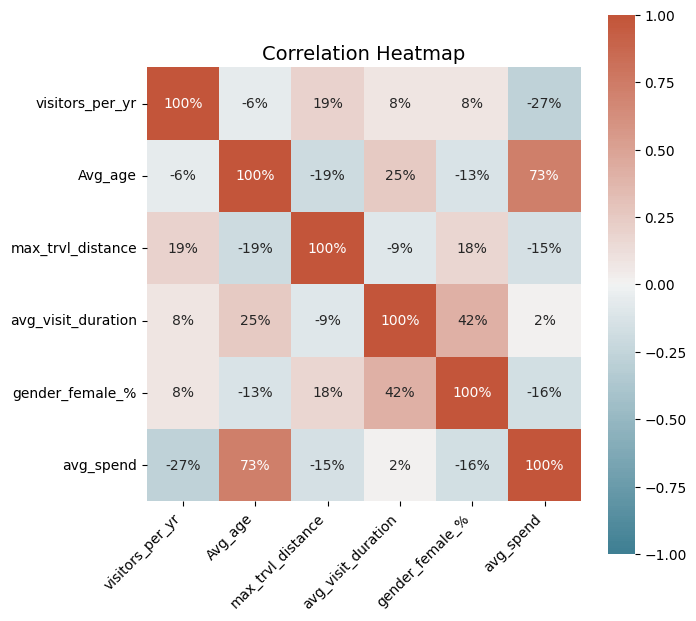

In [34]:
plt.figure(figsize=(7, 7))
corr = summary_data.corr()

ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0, 
    cmap=sns.diverging_palette(220, 20, n=200), 
    square=True, 
    annot=True,  # Show correlation values
    fmt=".0%",  # Format as percentage
    annot_kws={"size": 10}  # Adjust text size
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title("Correlation Heatmap", fontsize=14)
plt.savefig("Relationship final.png", dpi=300, bbox_inches="tight")
plt.show()

#correlations lvl_1: Average age and Average spend. (0.73)(Strong correlation, explore further)
#correlations lv_2: Gender_female_% and Average visit duriation (0.42)(mention, moderate positive correlation) 
#correlations lvl_3: [Average visit duration and average age (0.25)](Noise)
#correlations lvl_4: [max_travel distance and average spend (0.19)], max_travel distance and gender female(0.18)](Noise)


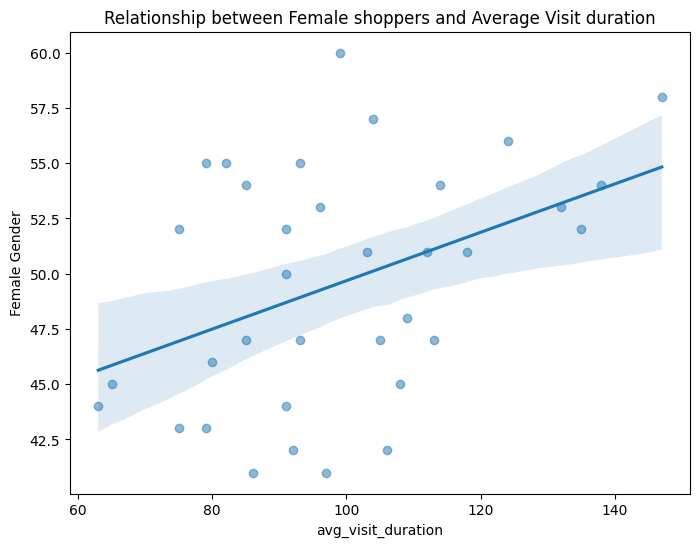

In [35]:
plt.figure(figsize=(8, 6))
sns.regplot(x=summary_data['avg_visit_duration'], y=summary_data['gender_female_%'], scatter_kws={'alpha':0.5})
plt.xlabel('avg_visit_duration')
plt.ylabel('Female Gender')
plt.title('Relationship between Female shoppers and Average Visit duration')
plt.show()

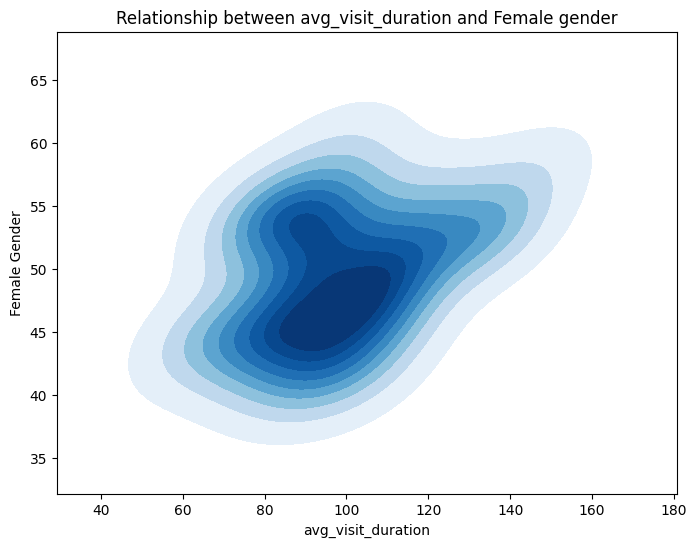

In [36]:
plt.figure(figsize=(8, 6))
sns.kdeplot(x=summary_data['avg_visit_duration'], y=summary_data['gender_female_%'], fill=True, cmap='Blues')
plt.xlabel('avg_visit_duration')
plt.ylabel('Female Gender')
plt.title('Relationship between avg_visit_duration and Female gender')
plt.show()

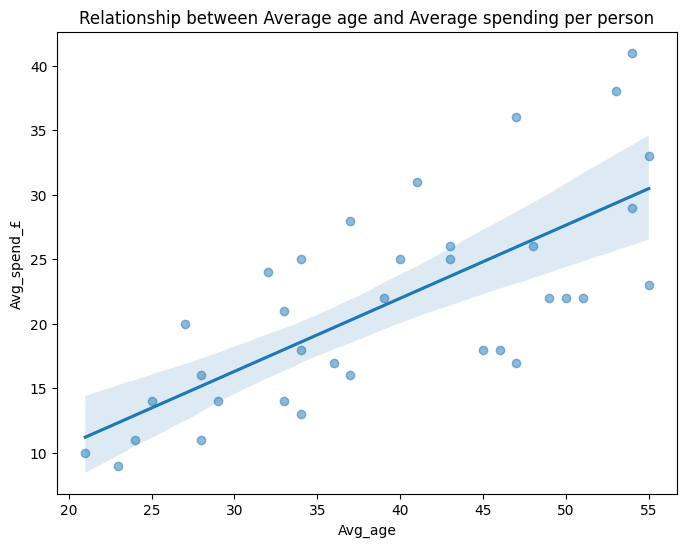

In [38]:
plt.figure(figsize=(8, 6))
sns.regplot(x=summary_data['Avg_age'], y=summary_data['avg_spend'], scatter_kws={'alpha':0.5})
plt.xlabel('Avg_age')
plt.ylabel('Avg_spend_£')
plt.title('Relationship between Average age and Average spending per person')
plt.show()

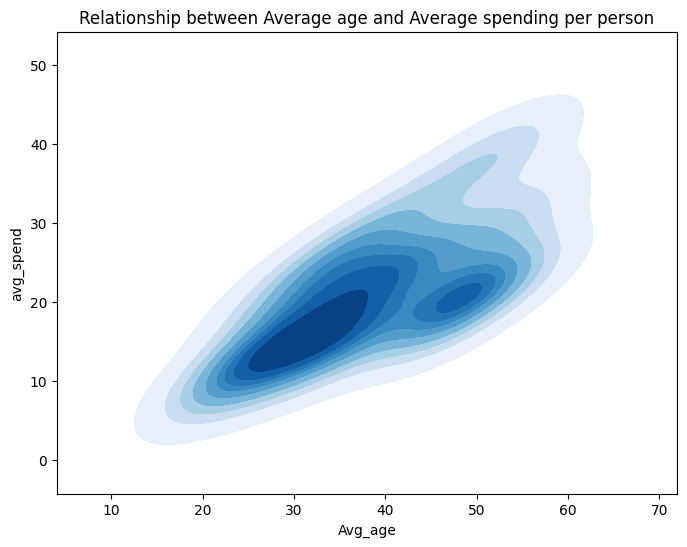

In [39]:
plt.figure(figsize=(8, 6))
sns.kdeplot(x=summary_data['Avg_age'], y=summary_data['avg_spend'], fill=True, cmap='Blues')
plt.xlabel('Avg_age')
plt.ylabel('avg_spend')
plt.title('Relationship between Average age and Average spending per person')
plt.show()

In [40]:
from scipy.stats import pearsonr

corr, p_value = pearsonr(summary_data['Avg_age'], summary_data['avg_spend'])
print(f'Correlation: {corr:.2f}, p-value: {p_value:.5f}')

Correlation: 0.73, p-value: 0.00000


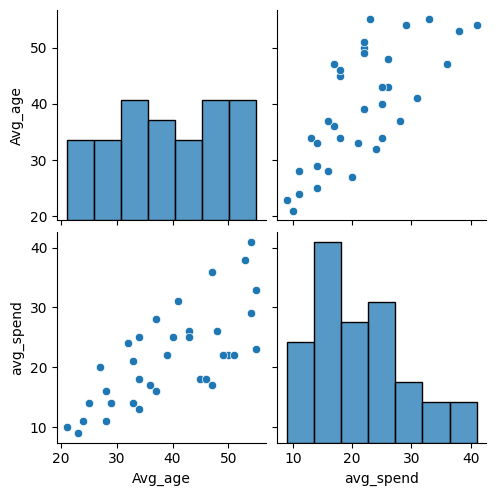

In [41]:
sns.pairplot(summary_data[['Avg_age', 'avg_spend']])
plt.show()

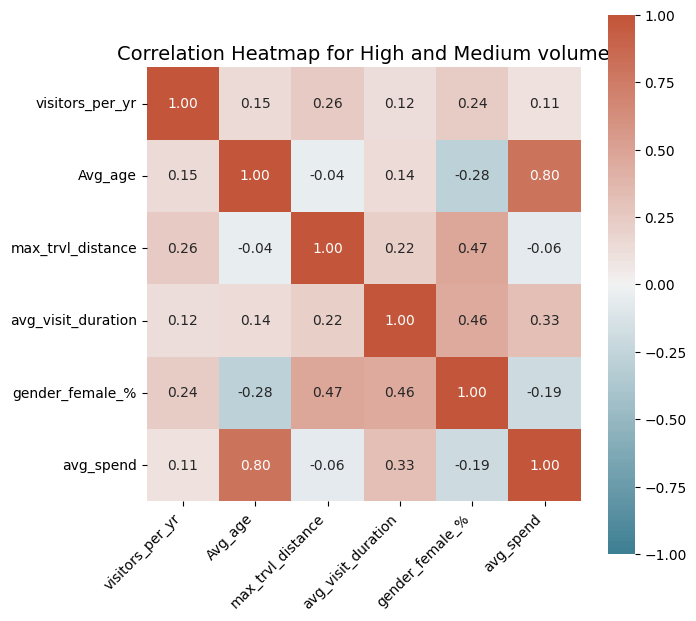

In [86]:
#correlation heatmap for high and Medium volume visitors
plt.figure(figsize=(7, 7))


selected = ['NGD', 'NMN', 'OSG', 'OAQ','MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']


selected_rows_df = summary_data.loc[selected]  # This keeps only the selected rows


corr = selected_rows_df.corr()

ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0, 
    cmap=sns.diverging_palette(220, 20, n=200), 
    square=True, 
    annot=True,  # Show correlation values
    fmt=".2f",  # Format as decimal
    annot_kws={"size": 10}  # Adjust text size
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title("Correlation Heatmap for High and Medium volume", fontsize=14)
plt.savefig("Relationshipzz_final.png", dpi=300, bbox_inches="tight")
plt.show()

     visitors_per_yr   Avg_age  max_trvl_distance  avg_visit_duration  \
NGD         1.000000  0.981818           0.188679            0.625850   
NMN         0.919963  0.381818           0.377358            0.578231   
OSG         0.899796  0.454545           0.245283            0.707483   
OAQ         0.893187  0.909091           0.415094            0.897959   
MGT         0.518888  0.818182           0.094340            0.734694   

     gender_female_%  avg_spend  
NGD         0.700000   0.707317  
NMN         0.900000   0.243902  
OSG         0.950000   0.341463  
OAQ         0.883333   0.536585  
MGT         0.750000   0.439024  


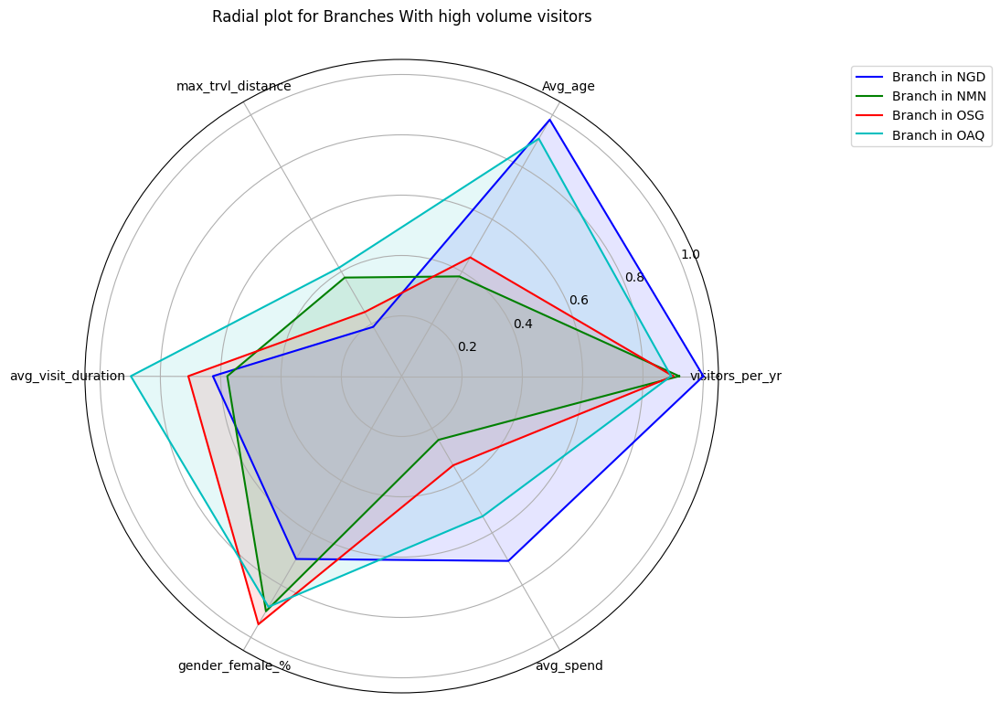

In [95]:
#radial plot for high volume visitors
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['NGD', 'NMN', 'OSG', 'OAQ']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(9, 9))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)],label='Branch in ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=2,bbox_to_anchor=(1.2, 1))
plt.title('Radial plot for Branches With high volume visitors',pad=30)
plt.savefig("Radial_high_final.png", dpi=300, bbox_inches="tight")
plt.show()
#Pay attention to the metrics of the high they are
# 1.They have high average ages except for Branch OSG and NMN
# 2.They generally tend to have less travelling distance 
# 3.Apart from branch OAQ,they all tend to have between 60-80 range of average visit duration, only OAQ has above 80
# 4.They all have an above 0.6 in the percentage of female visitors. 
# 5.Average spend is spread between 0.2 and 0.8. 

     visitors_per_yr   Avg_age  max_trvl_distance  avg_visit_duration  \
NGD         1.000000  0.981818           0.188679            0.625850   
NMN         0.919963  0.381818           0.377358            0.578231   
OSG         0.899796  0.454545           0.245283            0.707483   
OAQ         0.893187  0.909091           0.415094            0.897959   
MGT         0.518888  0.818182           0.094340            0.734694   

     gender_female_%  avg_spend  
NGD         0.700000   0.707317  
NMN         0.900000   0.243902  
OSG         0.950000   0.341463  
OAQ         0.883333   0.536585  
MGT         0.750000   0.439024  


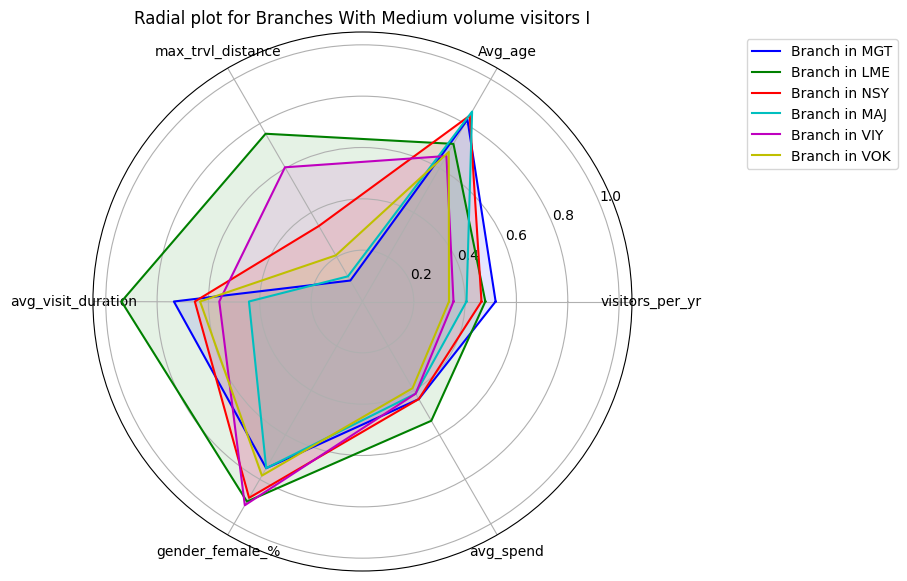

In [43]:
#radial plot for medium volume visitors
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(7, 7))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)],label='Branch in ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=2,bbox_to_anchor=(1.2, 1))
plt.title('Radial plot for Branches With Medium volume visitors I')
plt.show()
#

     visitors_per_yr   Avg_age  max_trvl_distance  avg_visit_duration  \
NGD         1.000000  0.981818           0.188679            0.625850   
NMN         0.919963  0.381818           0.377358            0.578231   
OSG         0.899796  0.454545           0.245283            0.707483   
OAQ         0.893187  0.909091           0.415094            0.897959   
MGT         0.518888  0.818182           0.094340            0.734694   

     gender_female_%  avg_spend  
NGD         0.700000   0.707317  
NMN         0.900000   0.243902  
OSG         0.950000   0.341463  
OAQ         0.883333   0.536585  
MGT         0.750000   0.439024  


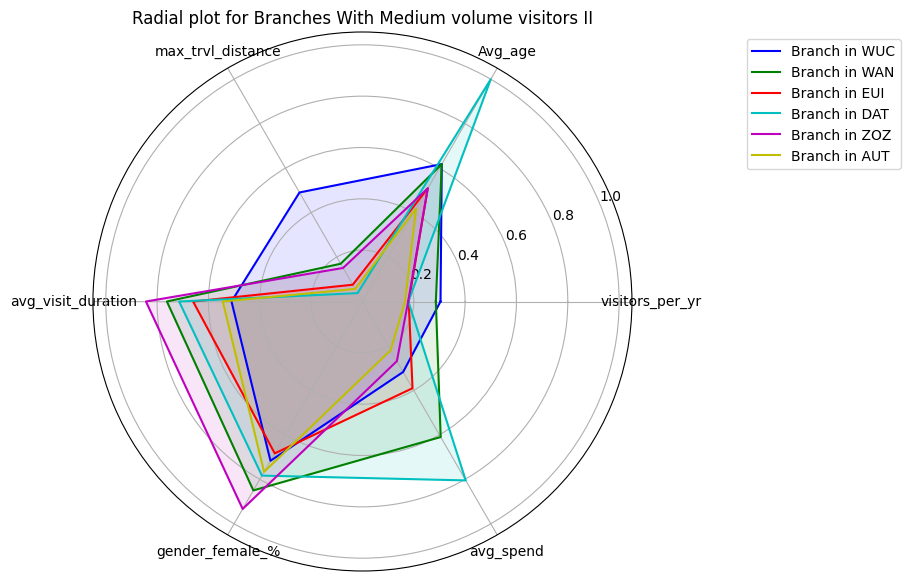

In [44]:
#radial plot for high volume visitors
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(7, 7))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)],label='Branch in ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=2,bbox_to_anchor=(1.2, 1))
plt.title('Radial plot for Branches With Medium volume visitors II')
plt.show()

In [45]:
#pay attention to the medium patterns 
# 1.Average spend is quite lower than the high, not significantly though, if average spend is calculated with total number then it makes sense. 
# 2.The medium branches, just like the high also exhibit a higher visit(patronage) by female visitors. 
# 3.They have lower average ages though, unlike the high volume, except Branch DAT
# Branch DAT is an anomaly, it tends to express the same features of high volume branches, however, has a low visitor rating, why??(missing data?,or just the nature of the branch)


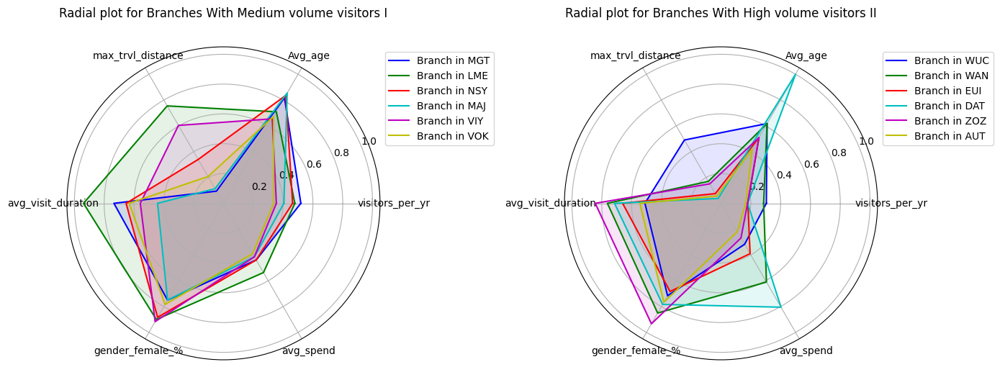

In [93]:
# Radial plot for medium volume visitors
normalised_data = summary_data / summary_data.max()
#print(normalised_data.head())

selected = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0

# Create a 1x2 subplot
plt.figure(figsize=(14, 7))

# Subplot 1 for Medium Volume Visitors
sub1 = plt.subplot(1, 2, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub1.plot(angles, values, colours[c % len(colours)], label='Branch in ' + name)
    sub1.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub1.set_ylim(ymax=1.05)
    sub1.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub1.set_xticks(angles[0:-1])
    sub1.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub1.set_xticklabels(normalised_data.columns)
    c += 1
sub1.set_title('Radial plot for Branches With Medium volume visitors I',pad=30)

# Radial plot for high volume visitors
selected = ['WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0

# Subplot 2 for High Volume Visitors
sub2 = plt.subplot(1, 2, 2, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub2.plot(angles, values, colours[c % len(colours)], label='Branch in ' + name)
    sub2.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub2.set_ylim(ymax=1.05)
    sub2.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub2.set_xticks(angles[0:-1])
    sub2.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub2.set_xticklabels(normalised_data.columns)
    c += 1
sub2.set_title('Radial plot for Branches With High volume visitors II',pad=30)

# Show the plots
plt.tight_layout()
plt.savefig("Radial_medium_final.png", dpi=300, bbox_inches="tight")
plt.show()

     visitors_per_yr   Avg_age  max_trvl_distance  avg_visit_duration  \
NGD         1.000000  0.981818           0.188679            0.625850   
NMN         0.919963  0.381818           0.377358            0.578231   
OSG         0.899796  0.454545           0.245283            0.707483   
OAQ         0.893187  0.909091           0.415094            0.897959   
MGT         0.518888  0.818182           0.094340            0.734694   

     gender_female_%  avg_spend  
NGD         0.700000   0.707317  
NMN         0.900000   0.243902  
OSG         0.950000   0.341463  
OAQ         0.883333   0.536585  
MGT         0.750000   0.439024  


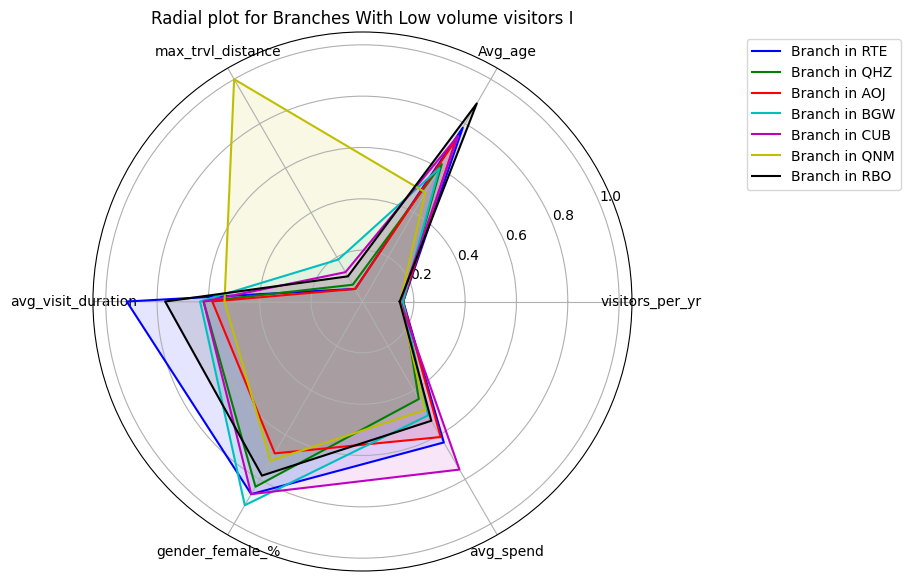

In [46]:
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(7, 7))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)],label='Branch in ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=2,bbox_to_anchor=(1.2, 1))
plt.title('Radial plot for Branches With Low volume visitors I')
plt.show()

     visitors_per_yr   Avg_age  max_trvl_distance  avg_visit_duration  \
NGD         1.000000  0.981818           0.188679            0.625850   
NMN         0.919963  0.381818           0.377358            0.578231   
OSG         0.899796  0.454545           0.245283            0.707483   
OAQ         0.893187  0.909091           0.415094            0.897959   
MGT         0.518888  0.818182           0.094340            0.734694   

     gender_female_%  avg_spend  
NGD         0.700000   0.707317  
NMN         0.900000   0.243902  
OSG         0.950000   0.341463  
OAQ         0.883333   0.536585  
MGT         0.750000   0.439024  


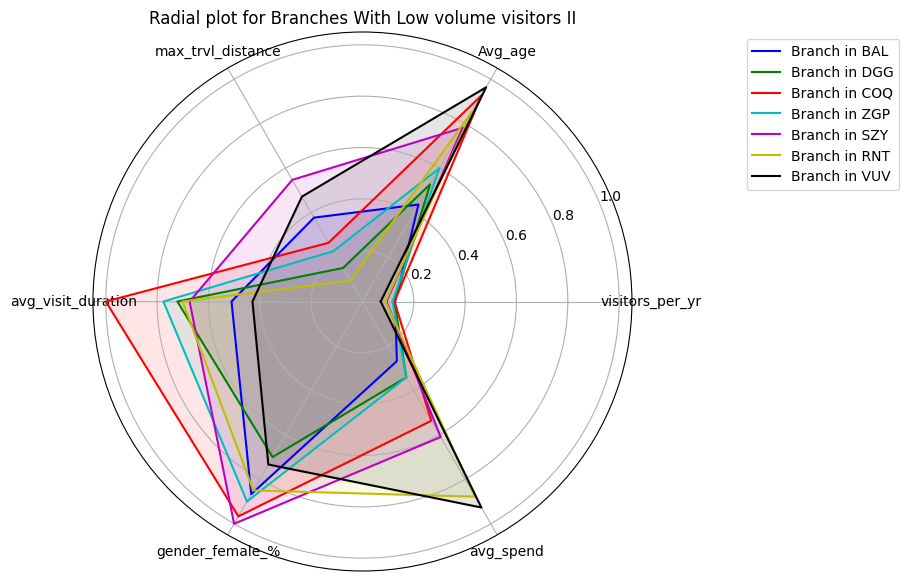

In [47]:
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(7, 7))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)],label='Branch in ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=2,bbox_to_anchor=(1.2, 1))
plt.title('Radial plot for Branches With Low volume visitors II')
plt.show()

     visitors_per_yr   Avg_age  max_trvl_distance  avg_visit_duration  \
NGD         1.000000  0.981818           0.188679            0.625850   
NMN         0.919963  0.381818           0.377358            0.578231   
OSG         0.899796  0.454545           0.245283            0.707483   
OAQ         0.893187  0.909091           0.415094            0.897959   
MGT         0.518888  0.818182           0.094340            0.734694   

     gender_female_%  avg_spend  
NGD         0.700000   0.707317  
NMN         0.900000   0.243902  
OSG         0.950000   0.341463  
OAQ         0.883333   0.536585  
MGT         0.750000   0.439024  


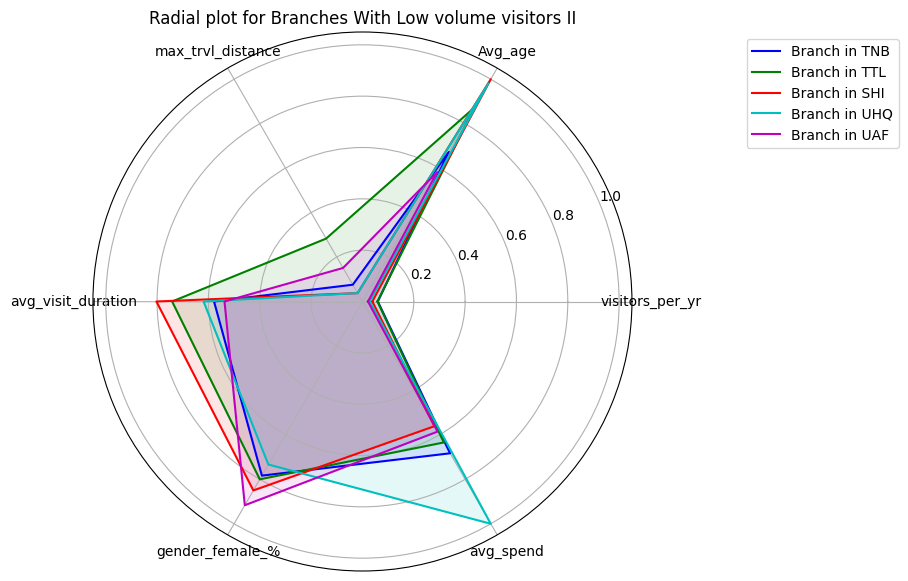

In [48]:
normalised_data = summary_data / summary_data.max()
print(normalised_data.head())

selected = ['TNB', 'TTL', 'SHI', 'UHQ', 'UAF']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(7, 7))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)],label='Branch in ' + name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.legend(loc='upper left', bbox_to_anchor=(1, 1))
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=2,bbox_to_anchor=(1.2, 1))
plt.title('Radial plot for Branches With Low volume visitors II')
plt.show()

In [49]:
#Time series
data.head(3)

,NGD,NMN,OSG,OAQ,MGT,LME,NSY,MAJ,VIY,VOK,...,COQ,ZGP,SZY,RNT,VUV,TNB,TTL,SHI,UHQ,UAF
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,597,584,533,516,323,282,297,202,242,212,...,62,63,95,0,0,0,45,0,0,0
2023-01-02,588,603,499,503,233,272,245,164,163,207,...,70,57,103,0,0,0,51,0,0,0
2023-01-03,466,431,434,475,246,192,186,155,153,105,...,58,56,98,0,0,0,82,0,0,0


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
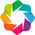

:Overlay
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [Date]   (value)
   .HLine.I     :HLine   [x,y]
   .Text.I      :Text   [x,y]

In [50]:
#From the interactive graphs, there is; 
#1. The pan button;when highlighted, you can click and drag across the graph to specific dates and/or number of volumes to get more insight. 
#2.There is the zoom button which makes use of the mouse scroll tool to zoom in on particular areas of the graph. 
#3.There is also a box zoon tool which allows you to highlight a section of the graph to zoom in on that part. 
#4.Lastly there is the save button which allows you save particular sections of the graph and a reset button which resets the graph back to the default position.
high_branches = ['NGD', 'NMN', 'OSG', 'OAQ']
medium_branches = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']
high_medium_threshold = data[high_branches + medium_branches].mean().mean()
plot = data.hvplot.line(
    frame_height=800, frame_width=900,
    xlabel='Date', ylabel='Visitors',
    title='Daily Visits with High-Medium Average Threshold',
    line_width=1,  # Make lines thinner
    legend_position='top_right'  # Adjust legend placement
).opts(legend_opts={'title_text_font_size': '10pt'})  # Reduce legend size


threshold_line = hv.HLine(high_medium_threshold).opts(color='red', line_width=2)


text_annotation = hv.Text(
    x=data.index[len(data) // 2],  # Middle of the x-axis
    y=high_medium_threshold + 5,   # Slightly above the threshold
    text=f"Threshold: {high_medium_threshold:.2f}"
).opts(color='red', fontsize=10)  # Reduce text size slightly


final_plot = plot * threshold_line * text_annotation

hv.extension('bokeh') 
#hv.save(final_plot, 'daily_visits_threshold.png', fmt='png')
hv.save(final_plot, 'daily_visits_threshold.html', fmt='html')


final_plot

In [51]:
# Define branch categories
high_branches = ['NGD', 'NMN', 'OSG', 'OAQ']
medium_branches = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']

# Compute the average daily visits for High and Medium branches combined
high_medium_avg = data[high_branches + medium_branches].mean(axis=1)

# Create the base plot for all branches
plot = data.hvplot.line(
    frame_height=900, frame_width=900,
    xlabel='Date', ylabel='Visitors',
    title='Daily Visits with High-Medium Average Line'
)

# Add the High & Medium average as a separate line
avg_line = high_medium_avg.hvplot.line(color='red', line_width=3, label='High-Medium Avg')

# Combine plots
final_plot = plot * avg_line

final_plot

:Overlay
   .NdOverlay.I                        :NdOverlay   [Variable]
      :Curve   [Date]   (value)
   .Curve.High_hyphen_minus_Medium_Avg :Curve   [Date]   (0)

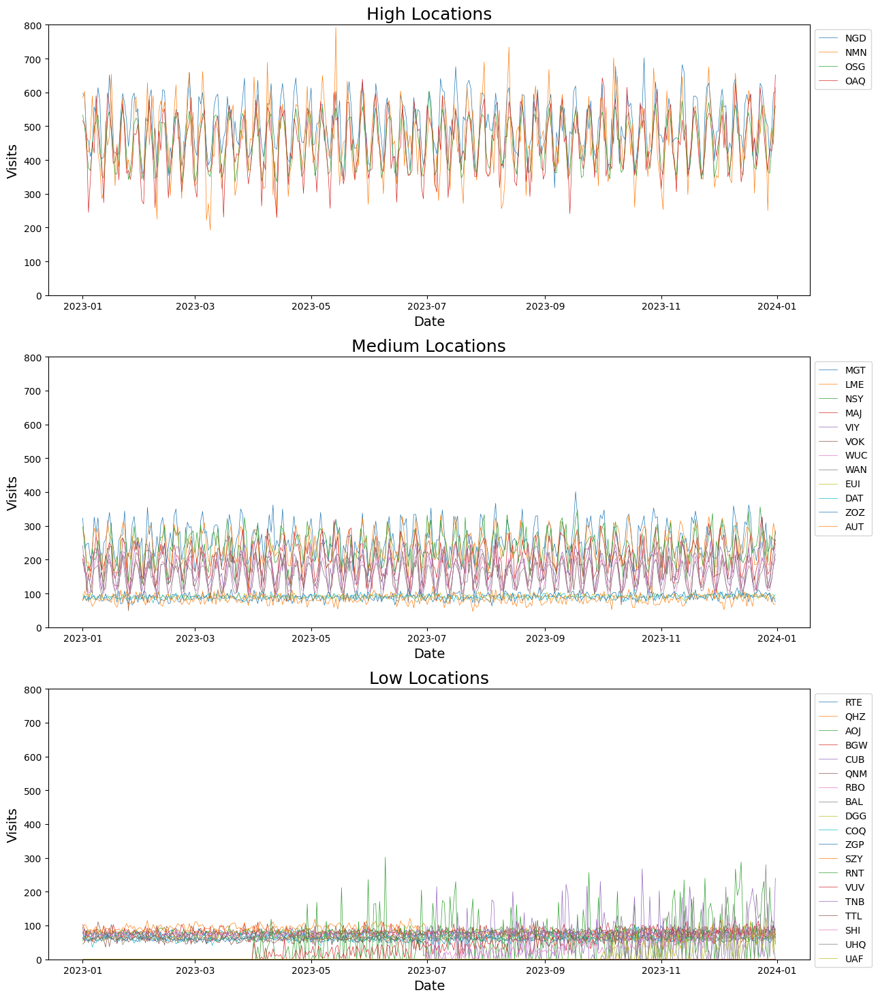

In [52]:
# Define the categories
high_locations = ['NGD', 'NMN', 'OSG', 'OAQ']
medium_locations = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']
low_locations = ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']

# Create subplots (3 rows, 1 column)
fig, axes = plt.subplots(3, 1, figsize=(13, 15))

# High locations plot
for location in high_locations:
    if location in data.columns:
        axes[0].plot(data[location], linewidth=0.5, label=location)
axes[0].set_title('High Locations', fontsize=18)
axes[0].set_xlabel('Date', fontsize=14)
axes[0].set_ylabel('Visits', fontsize=14)
axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))

# Medium locations plot
for location in medium_locations:
    if location in data.columns:
        axes[1].plot(data[location], linewidth=0.5, label=location)
axes[1].set_title('Medium Locations', fontsize=18)
axes[1].set_xlabel('Date', fontsize=14)
axes[1].set_ylabel('Visits', fontsize=14)
axes[1].legend(loc='upper left', bbox_to_anchor=(1, 1))

# Low locations plot
for location in low_locations:
    if location in data.columns:
        axes[2].plot(data[location], linewidth=0.5, label=location)
axes[2].set_title('Low Locations', fontsize=18)
axes[2].set_xlabel('Date', fontsize=14)
axes[2].set_ylabel('Visits', fontsize=14)
axes[2].legend(loc='upper left', bbox_to_anchor=(1, 1))

# Lock the y-axis to zero for each subplot
axes[0].set_ylim(bottom=0, top=800)
axes[1].set_ylim(bottom=0,top=800)
axes[2].set_ylim(bottom=0,top=800)

# Adjust layout and show the plot
plt.tight_layout()
plt.savefig("Separated_fig.png", dpi=300, bbox_inches="tight")
plt.show()


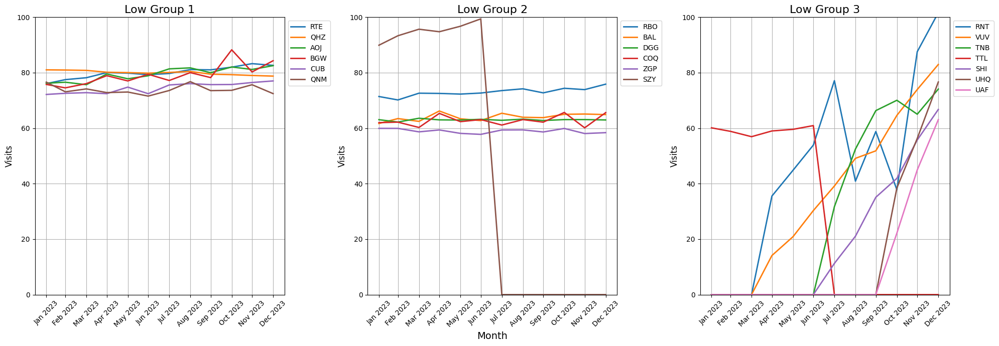

In [53]:
# Low locations
low_locations = ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']

# Filter the low locations data
low_data = data[low_locations]

# Resample the data to monthly frequency, assuming the index is a DateTime object
monthly_low_data = low_data.resample('ME').mean()  # 'ME' stands for monthly frequency
monthly_low_data = monthly_low_data.reindex(
    pd.date_range(start=monthly_low_data.index.min(), end=monthly_low_data.index.max(), freq='ME'),
    fill_value=0
)

# Divide locations into three groups for subplots
group1 = low_locations[:6]  # First six locations
group2 = low_locations[6:12]  # Next six locations
group3 = low_locations[12:]  # Last six locations

# Create the color map
#colors = cm.get_cmap('tab20', len(low_locations))  # 'tab20' gives up to 20 colors

# Create a figure and subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(20, 7), sharex=True)

# Loop through each group and plot
for ax, group, title in zip(axes, [group1, group2, group3], ["Low Group 1", "Low Group 2", "Low Group 3"]):
    for i, location in enumerate(group):
        if location in monthly_low_data.columns:
            ax.plot(monthly_low_data.index, monthly_low_data[location], label=location,linewidth=2)
    ax.set_title(title, fontsize=16)
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=10)
    ax.grid(True)
    ax.set_ylabel('Visits', fontsize=12)
    
    # Set x-axis ticks and labels for each subplot
    ax.set_xticks(monthly_low_data.index)
    ax.set_xticklabels(monthly_low_data.index.strftime('%b %Y'), rotation=45)

# Add common x-axis label (optional)
axes[1].set_xlabel('Month', fontsize=14)
# Lock the y-axis to zero for each subplot
axes[0].set_ylim(bottom=0, top=100)
axes[1].set_ylim(bottom=0,top=100)
axes[2].set_ylim(bottom=0,top=100)


# Adjust layout
plt.tight_layout()

# Save the plot
plt.savefig("Low_values_subplots_side_by_side_final.pdf", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

In [54]:
summary_data.head()
print(data.head(5))

            NGD  NMN  OSG  OAQ  MGT  LME  NSY  MAJ  VIY  VOK  ...  COQ  ZGP  \
Date                                                          ...             
2023-01-01  597  584  533  516  323  282  297  202  242  212  ...   62   63   
2023-01-02  588  603  499  503  233  272  245  164  163  207  ...   70   57   
2023-01-03  466  431  434  475  246  192  186  155  153  105  ...   58   56   
2023-01-04  456  423  376  245  249  193  168  181  140  159  ...   54   57   
2023-01-05  410  471  369  341  203  147  183  166  140  119  ...   66   58   

            SZY  RNT  VUV  TNB  TTL  SHI  UHQ  UAF  
Date                                                
2023-01-01   95    0    0    0   45    0    0    0  
2023-01-02  103    0    0    0   51    0    0    0  
2023-01-03   98    0    0    0   82    0    0    0  
2023-01-04   75    0    0    0   55    0    0    0  
2023-01-05   89    0    0    0   56    0    0    0  

[5 rows x 35 columns]


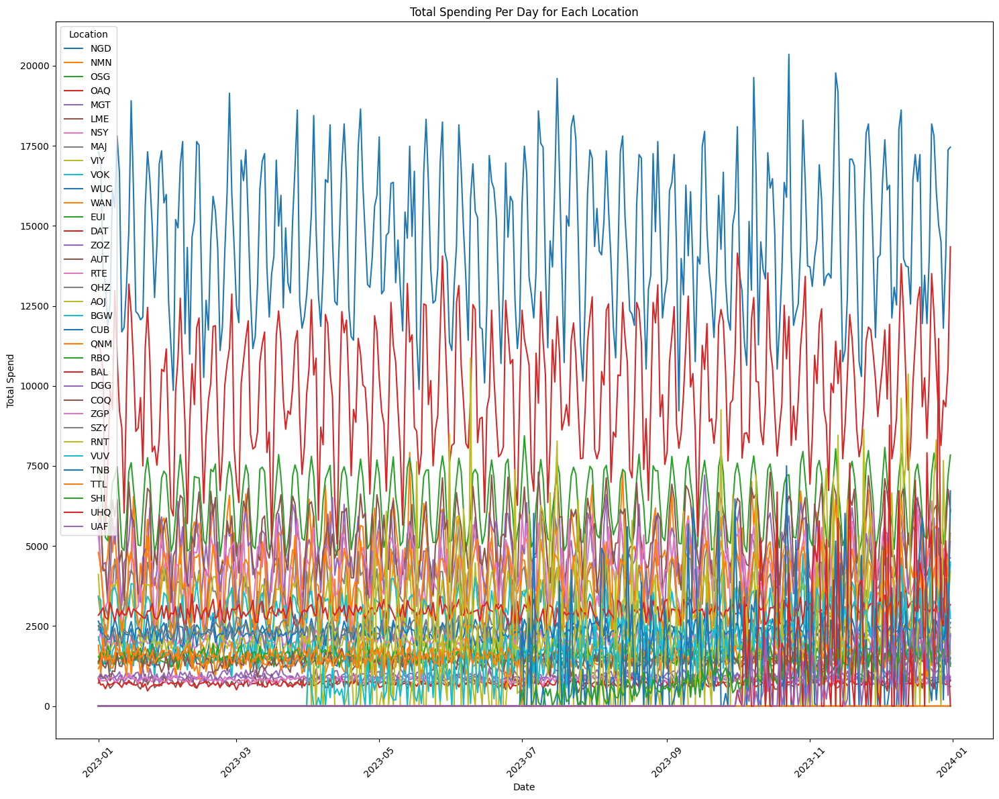

In [55]:
# Assuming your data is structured like this:
df_visitors = data  # Your dataset with visitors data
df_spend = summary_data['avg_spend']  # Your average spend per location

# Resetting the index to get 'Date' as a column again
df_visitors_reset = df_visitors.reset_index()

# Prepare the merged data for total spend calculation
# We need to melt the visitors data to long format, keeping 'Date' as the identifier
df_visitors_long = pd.melt(df_visitors_reset, id_vars=['Date'], var_name='Location', value_name='Visitors')

# Merge with the average spend data
df_visitors_long = df_visitors_long.merge(df_spend, left_on='Location', right_index=True)

# Calculate total spending for each location per day
df_visitors_long['Total_Spend'] = df_visitors_long['Visitors'] * df_visitors_long['avg_spend']

# Plotting the time-series graph
plt.figure(figsize=(15,12))

for location in df_visitors_long['Location'].unique():
    location_data = df_visitors_long[df_visitors_long['Location'] == location]
    plt.plot(location_data['Date'], location_data['Total_Spend'], label=location)

plt.title('Total Spending Per Day for Each Location')
plt.xlabel('Date')
plt.ylabel('Total Spend')
plt.legend(title='Location')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [56]:
#Histogram daily total visitors
x_min = 3000
x_max = 6600
bin_width = 50

n_bins = int((x_max - x_min) / bin_width)
print(f'{n_bins} bins')
bins = [(x_min + x * bin_width) for x in range(n_bins + 1)]

plot = data.sum(axis=1).hvplot.hist(
    bins=bins,
    frame_height=700, frame_width=700,
    xlabel='Daily Visitor Count', ylabel='Number of Days (Frequency)',
    title='Distribution of Daily Visitor Counts',
    alpha=0.5, muted_alpha=0, muted_fill_alpha=0, muted_line_alpha=0,
    tools=['undo', 'redo']
)

plot

72 bins


:Histogram   [0]   (Count)

72 bins


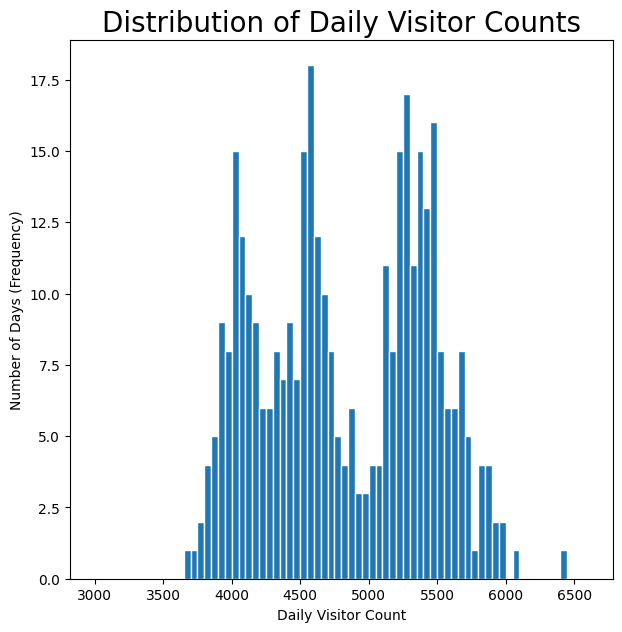

In [57]:
#Histogram daily total visitors
x_min = 3000
x_max = 6600
bin_width = 50

n_bins = int((x_max - x_min) / bin_width)
print(f'{n_bins} bins')
bins = [(x_min + x * bin_width) for x in range(n_bins + 1)]

plt.figure(figsize=(7,7))
plt.hist(data.sum(axis=1), bins, edgecolor='w') 
plt.title('Distribution of Daily Visitor Counts', fontsize=20)
plt.xlabel('Daily Visitor Count') 
plt.ylabel('Number of Days (Frequency)')

plt.show()

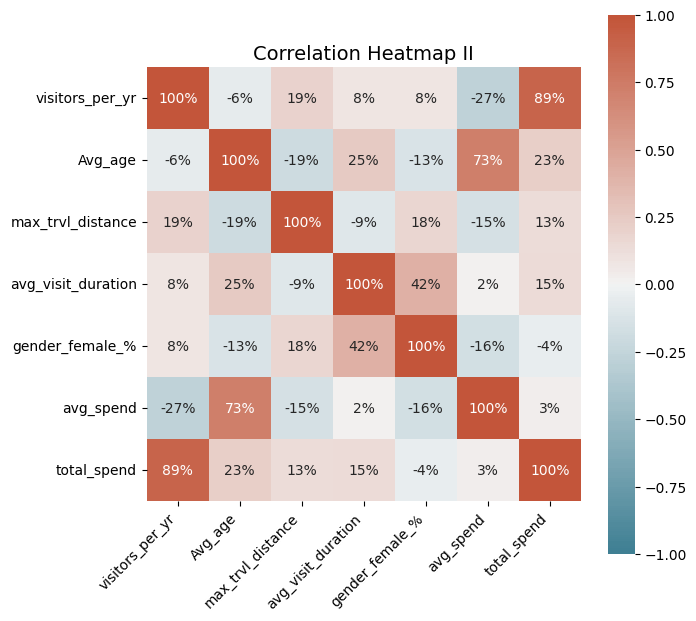

In [58]:
plt.figure(figsize=(7, 7))
corr = summary_data_two.corr()

ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0, 
    cmap=sns.diverging_palette(220, 20, n=200), 
    square=True, 
    annot=True,  # Show correlation values
    fmt=".0%",  # Format as percentage
    annot_kws={"size": 10}  # Adjust text size
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title("Correlation Heatmap II", fontsize=14)
plt.savefig("Relationship_2.png", dpi=300, bbox_inches="tight")
plt.show()


In [59]:
 summary_data_two.head()

,visitors_per_yr,Avg_age,max_trvl_distance,avg_visit_duration,gender_female_%,avg_spend,total_spend
NGD,183666,54,10,92,42,29,5326314
NMN,168966,21,20,85,54,10,1689660
OSG,165262,25,13,104,57,14,2313668
OAQ,164048,50,22,132,53,22,3609056
MGT,95302,45,5,108,45,18,1715436


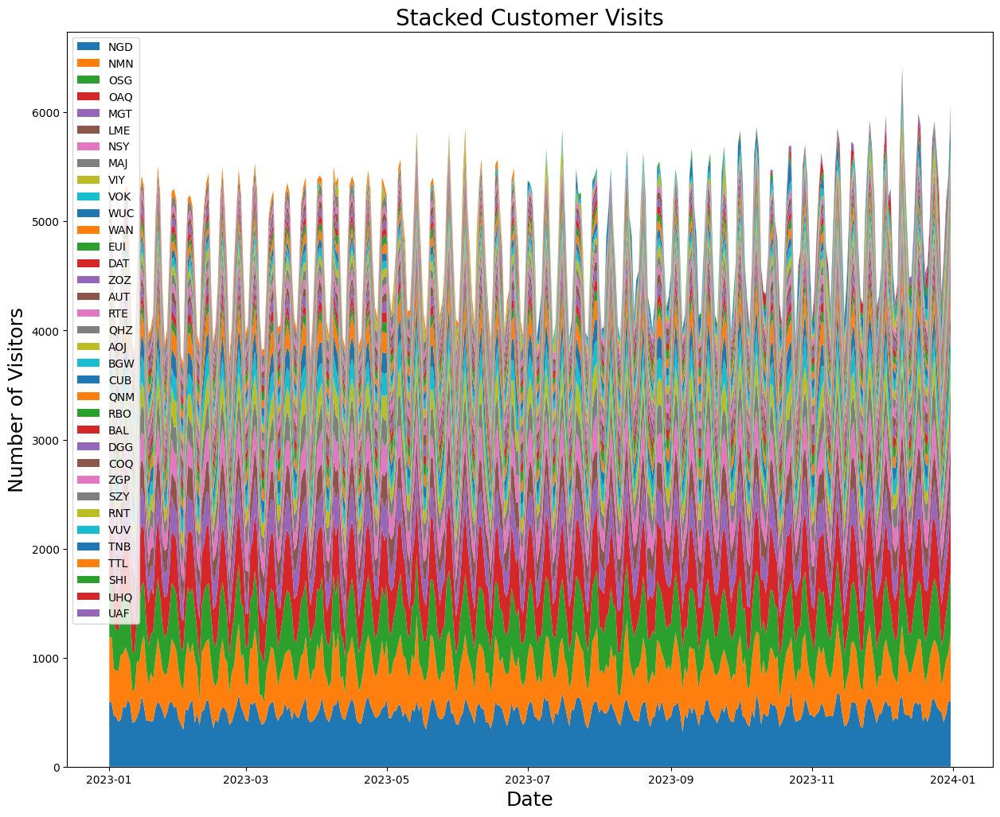

In [60]:
plt.figure(figsize=(15, 12))
# data.plot.area(figsize=(7, 7))
plt.stackplot(data.index, data.transpose())
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Visitors', fontsize=18)
plt.title('Stacked Customer Visits', fontsize=20)
plt.legend(data.columns, loc=2)
plt.show()
#shows nothing significant

            NGD  NMN  OSG  OAQ
Date                          
2023-01-01  597  584  533  516
2023-01-02  588  603  499  503
2023-01-03  466  431  434  475
2023-01-04  456  423  376  245
2023-01-05  410  471  369  341


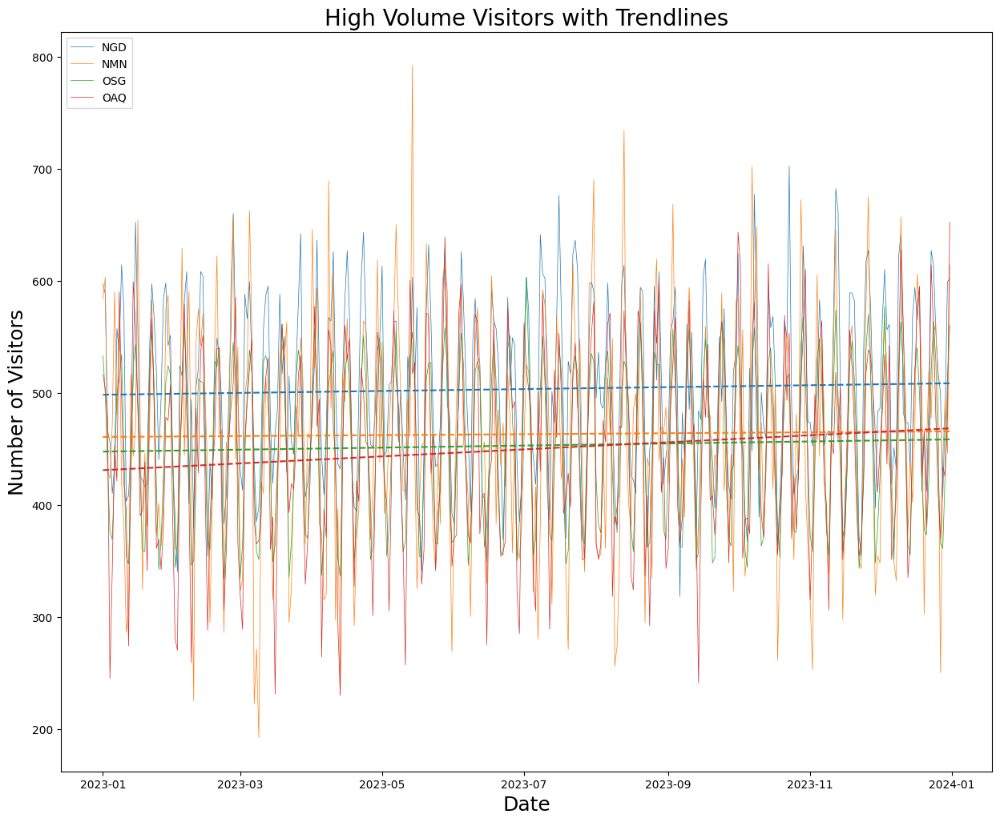

In [61]:
#high volume with trendline
selected =  ['NGD', 'NMN', 'OSG', 'OAQ']
print(data[selected].head())

plt.figure(figsize=(15, 12))
plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
for name in selected:
    x = np.arange(len(data[name]))
    z = np.polyfit(x, data[name], 1)
    trend = np.poly1d(z)
    plt.plot(data.index, trend(x), linestyle='--')
# plt.ylim(ymin=0)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Visitors', fontsize=18)
plt.title('High Volume Visitors with Trendlines', fontsize=20)
plt.legend(selected, loc=2)
plt.show()

            MGT  LME  NSY  MAJ  VIY  VOK  WUC  WAN  EUI  DAT  ZOZ  AUT
Date                                                                  
2023-01-01  323  282  297  202  242  212  204  192   97   86   79   79
2023-01-02  233  272  245  164  163  207  188  172   85   89   94  107
2023-01-03  246  192  186  155  153  105  144  140   79   93   79   96
2023-01-04  249  193  168  181  140  159  101   75   89   84   89   98
2023-01-05  203  147  183  166  140  119  104  105   99   82   84   80


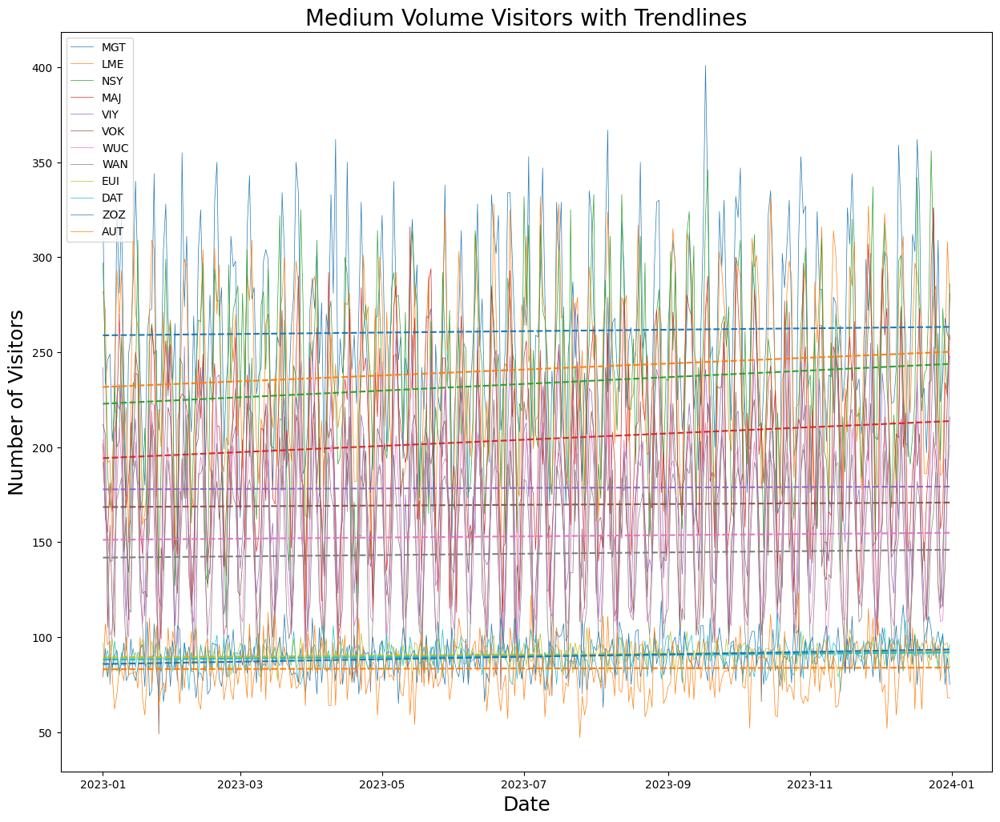

In [62]:
selected = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']
print(data[selected].head())

plt.figure(figsize=(15, 12))
plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
for name in selected:
    x = np.arange(len(data[name]))
    z = np.polyfit(x, data[name], 1)
    trend = np.poly1d(z)
    plt.plot(data.index, trend(x), linestyle='--')
# plt.ylim(ymin=0)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Visitors', fontsize=18)
plt.title('Medium Volume Visitors with Trendlines', fontsize=20)
plt.legend(selected, loc=2)
plt.show()

            MGT  LME  NSY  MAJ  VIY  VOK  WUC  WAN  EUI  DAT  ZOZ  AUT
Date                                                                  
2023-01-01  323  282  297  202  242  212  204  192   97   86   79   79
2023-01-02  233  272  245  164  163  207  188  172   85   89   94  107
2023-01-03  246  192  186  155  153  105  144  140   79   93   79   96
2023-01-04  249  193  168  181  140  159  101   75   89   84   89   98
2023-01-05  203  147  183  166  140  119  104  105   99   82   84   80


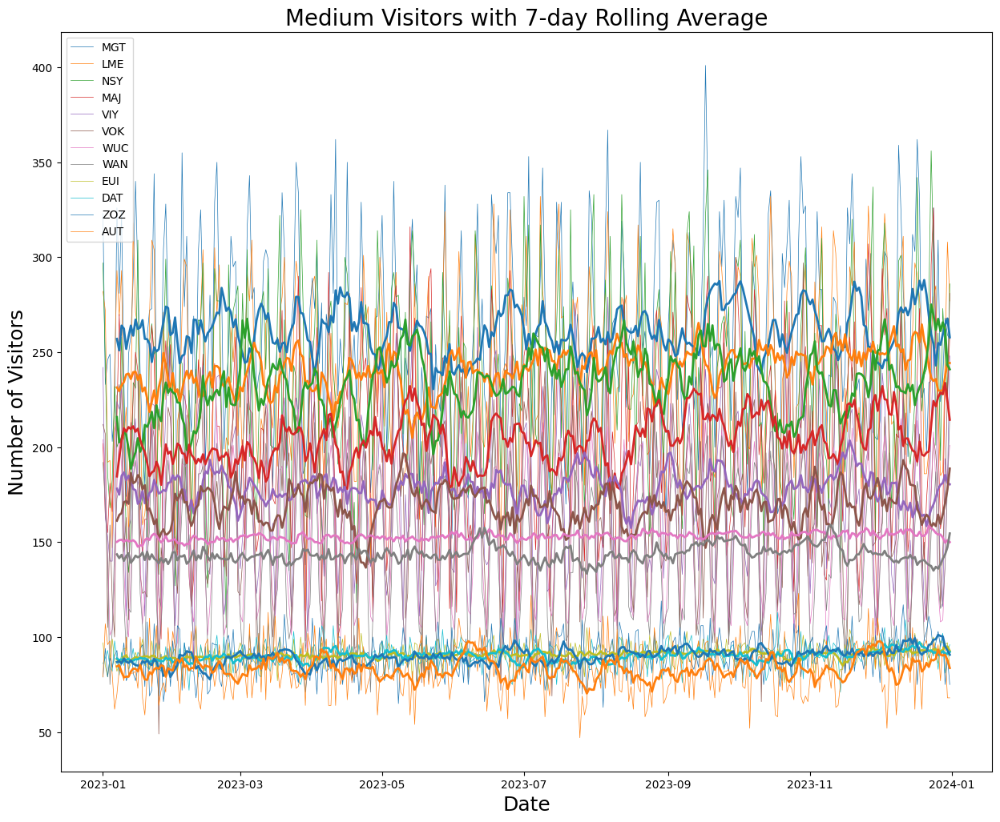

In [63]:
period = 7
rolling_average = data.rolling(window=period).mean()

selected = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']
print(data[selected].head())

plt.figure(figsize=(15, 12))
plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[selected], linewidth=2)
# plt.ylim(ymin=0)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Visitors', fontsize=18)
plt.title('Medium Visitors with 7-day Rolling Average', fontsize=20)
plt.legend(selected, loc=2)
plt.show()

            NGD  NMN  OSG  OAQ
Date                          
2023-01-01  597  584  533  516
2023-01-02  588  603  499  503
2023-01-03  466  431  434  475
2023-01-04  456  423  376  245
2023-01-05  410  471  369  341


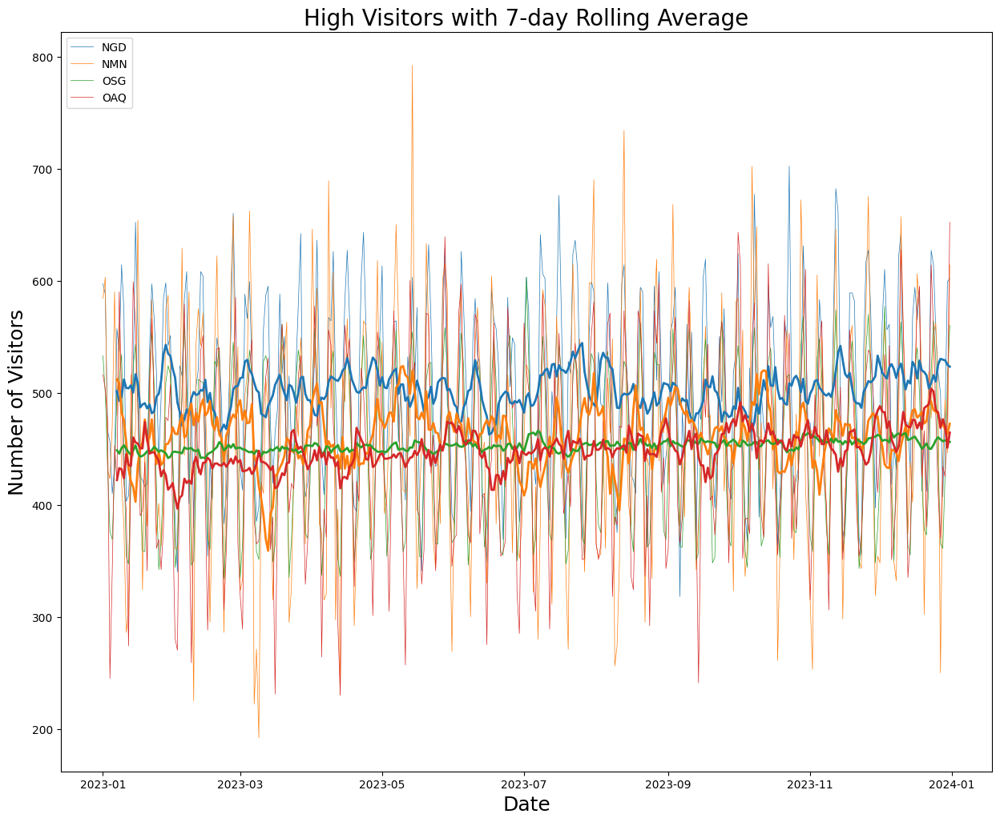

In [64]:
period = 7
rolling_average = data.rolling(window=period).mean()

selected = ['NGD', 'NMN', 'OSG', 'OAQ']
print(data[selected].head())

plt.figure(figsize=(15, 12))
plt.plot(data[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[selected], linewidth=2)
# plt.ylim(ymin=0)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Number of Visitors', fontsize=18)
plt.title('High Visitors with 7-day Rolling Average', fontsize=20)
plt.legend(selected, loc=2)
plt.show()

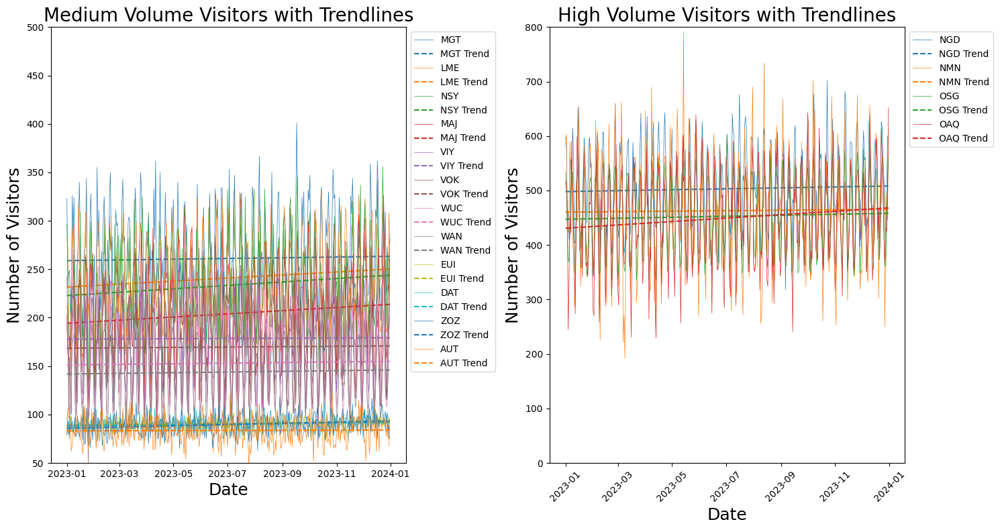

In [108]:

# Create a figure and 2 subplots (for medium and high volume visitors)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

# Script 1: Medium Volume Visitors
selected_medium = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']
data_medium = data[selected_medium]

# Script 2: High Volume Visitors
selected_high = ['NGD', 'NMN', 'OSG', 'OAQ']
data_high = data[selected_high]

# Set color cycle for consistent coloring
color_cycle = plt.cm.tab10.colors  # You can use any color map here

# Medium Volume Visitors Plot
for i, name in enumerate(selected_medium):
    x = np.arange(len(data_medium[name]))
    z = np.polyfit(x, data_medium[name], 1)
    trend = np.poly1d(z)
    color = color_cycle[i % len(color_cycle)]  # Cycle colors to match

    ax1.plot(data.index, data_medium[name], linewidth=0.5, label=name, color=color)
    ax1.plot(data.index, trend(x), linestyle='--', label=f"{name} Trend", color=color)  # Trend line color matches data

# High Volume Visitors Plot
for i, name in enumerate(selected_high):
    x = np.arange(len(data_high[name]))
    z = np.polyfit(x, data_high[name], 1)
    trend = np.poly1d(z)
    color = color_cycle[i % len(color_cycle)]  # Cycle colors to match

    ax2.plot(data.index, data_high[name], linewidth=0.5, label=name, color=color)
    ax2.plot(data.index, trend(x), linestyle='--', label=f"{name} Trend", color=color)  # Trend line color matches data

# Customize subplots and layout
ax1.set_title('Medium Volume Visitors with Trendlines', fontsize=20)
ax2.set_title('High Volume Visitors with Trendlines', fontsize=20)

ax1.set_xlabel('Date', fontsize=18)
ax1.set_ylabel('Number of Visitors', fontsize=18)
ax2.set_xlabel('Date', fontsize=18)
ax2.set_ylabel('Number of Visitors', fontsize=18)
ax1.set_ylim(50, 500)
ax2.set_ylim(0, 800)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add legends
ax1.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax2.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.savefig("trend_lines_final.png", dpi=300, bbox_inches="tight")
plt.show()


In [65]:
data.head()

,NGD,NMN,OSG,OAQ,MGT,LME,NSY,MAJ,VIY,VOK,...,COQ,ZGP,SZY,RNT,VUV,TNB,TTL,SHI,UHQ,UAF
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,597,584,533,516,323,282,297,202,242,212,...,62,63,95,0,0,0,45,0,0,0
2023-01-02,588,603,499,503,233,272,245,164,163,207,...,70,57,103,0,0,0,51,0,0,0
2023-01-03,466,431,434,475,246,192,186,155,153,105,...,58,56,98,0,0,0,82,0,0,0
2023-01-04,456,423,376,245,249,193,168,181,140,159,...,54,57,75,0,0,0,55,0,0,0
2023-01-05,410,471,369,341,203,147,183,166,140,119,...,66,58,89,0,0,0,56,0,0,0


In [66]:
print(data.columns)

Index(['NGD', 'NMN', 'OSG', 'OAQ', 'MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK',
       'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT', 'RTE', 'QHZ', 'AOJ', 'BGW',
       'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV',
       'TNB', 'TTL', 'SHI', 'UHQ', 'UAF'],
      dtype='object')


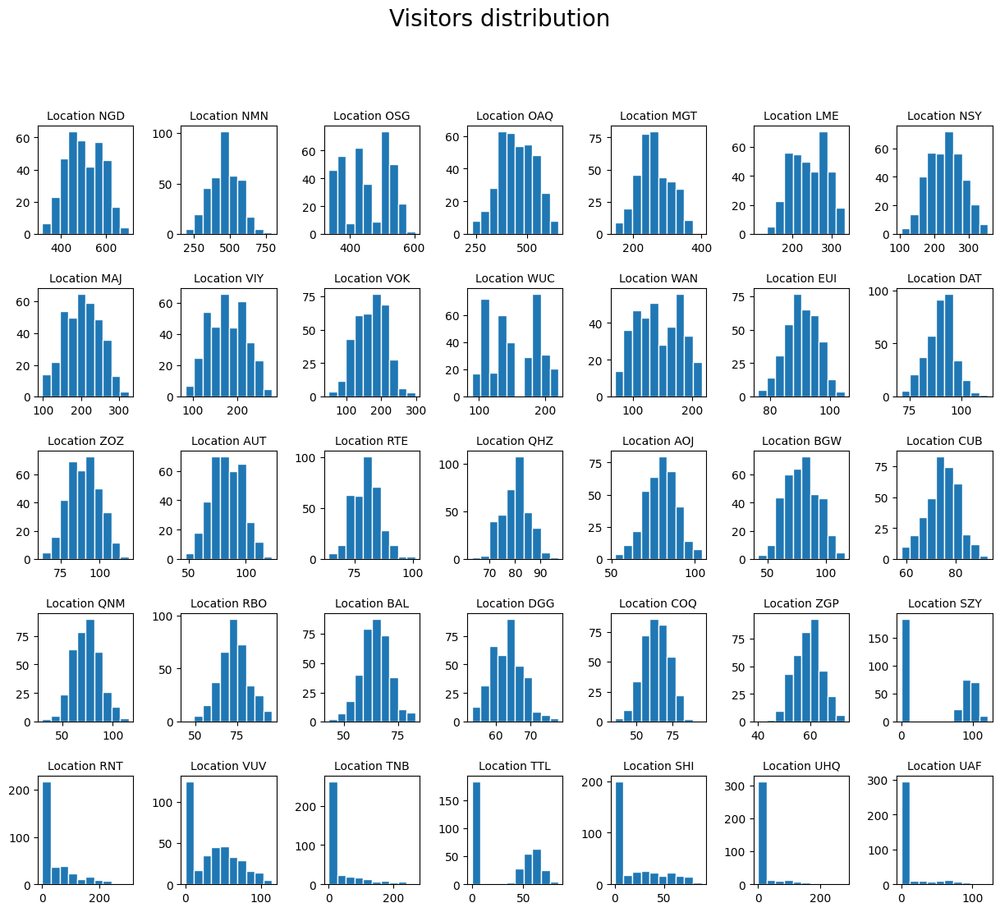

In [67]:
counter = 1
fig = plt.figure(figsize=(15, 12))
fig.suptitle('Visitors distribution', fontsize=20, position=(0.5, 1.0))
for name in data:
    sub = fig.add_subplot(5, 7, counter)
    sub.set_title('Location ' + name, fontsize=10)
    sub.hist(data[name], edgecolor='w')
    counter += 1
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()

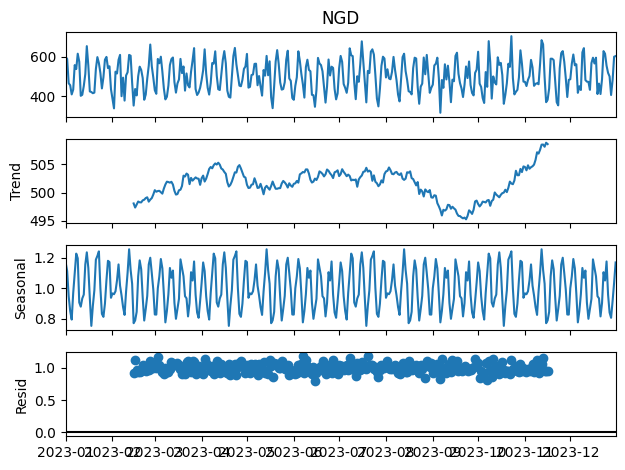

<Figure size 1400x800 with 0 Axes>

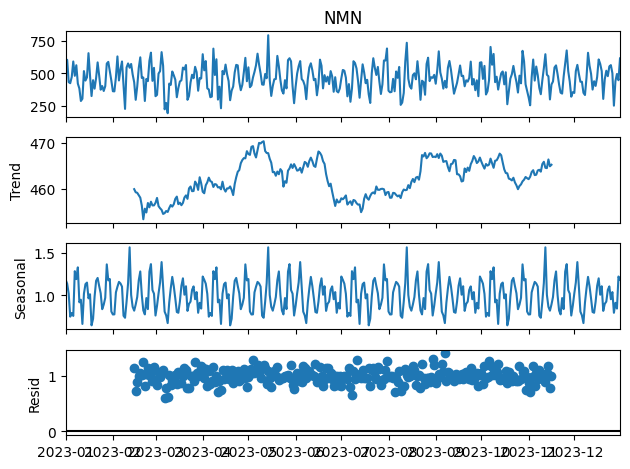

<Figure size 1400x800 with 0 Axes>

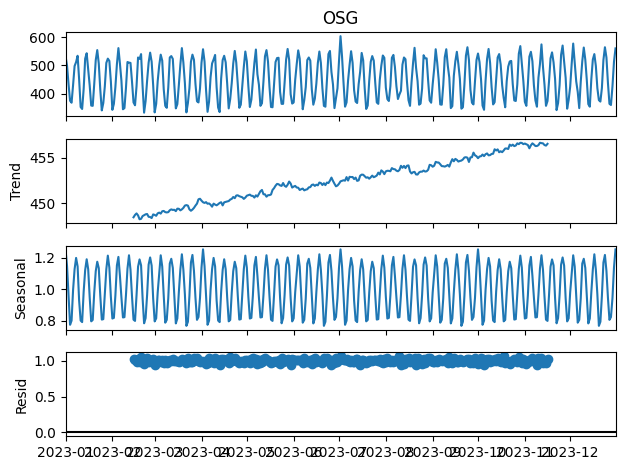

<Figure size 1400x800 with 0 Axes>

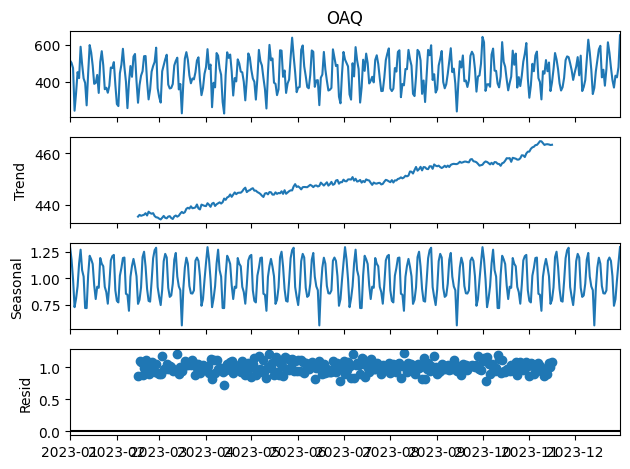

<Figure size 1400x800 with 0 Axes>

In [68]:
#seasonal decomposition for high
selected = ['NGD', 'NMN', 'OSG', 'OAQ']

for name in selected:
    result = seasonal_decompose(data[name], model='multiplicative', period=91)
    result.plot()
    plt.figure(figsize=(14, 8))
    plt.suptitle('Branch: ' + name, position=(0.5, 1.0))
    plt.show()

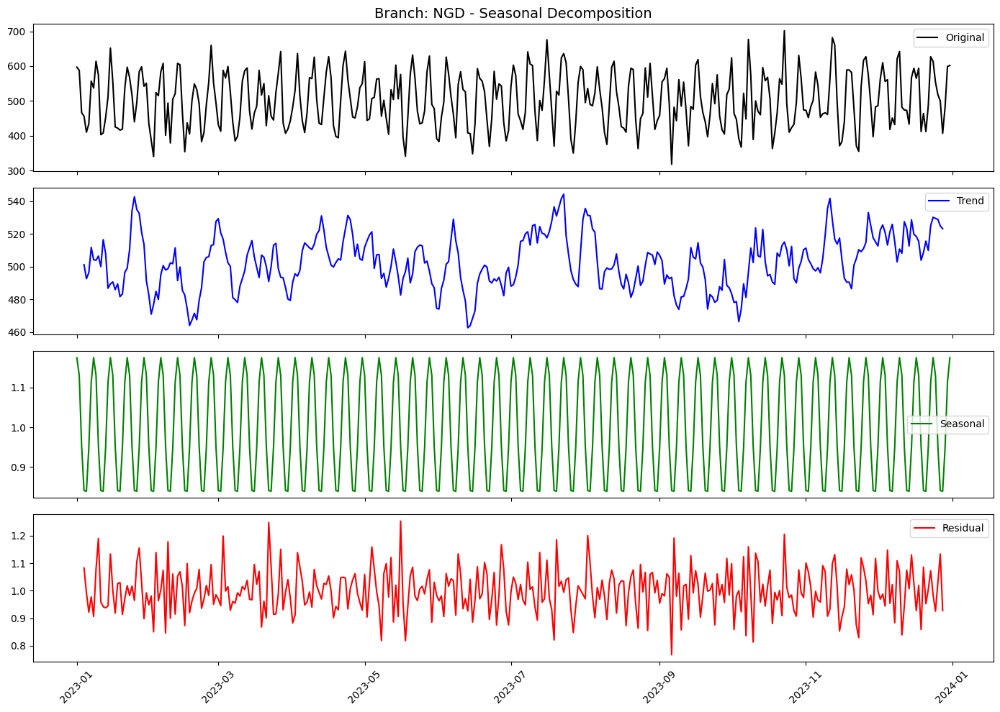

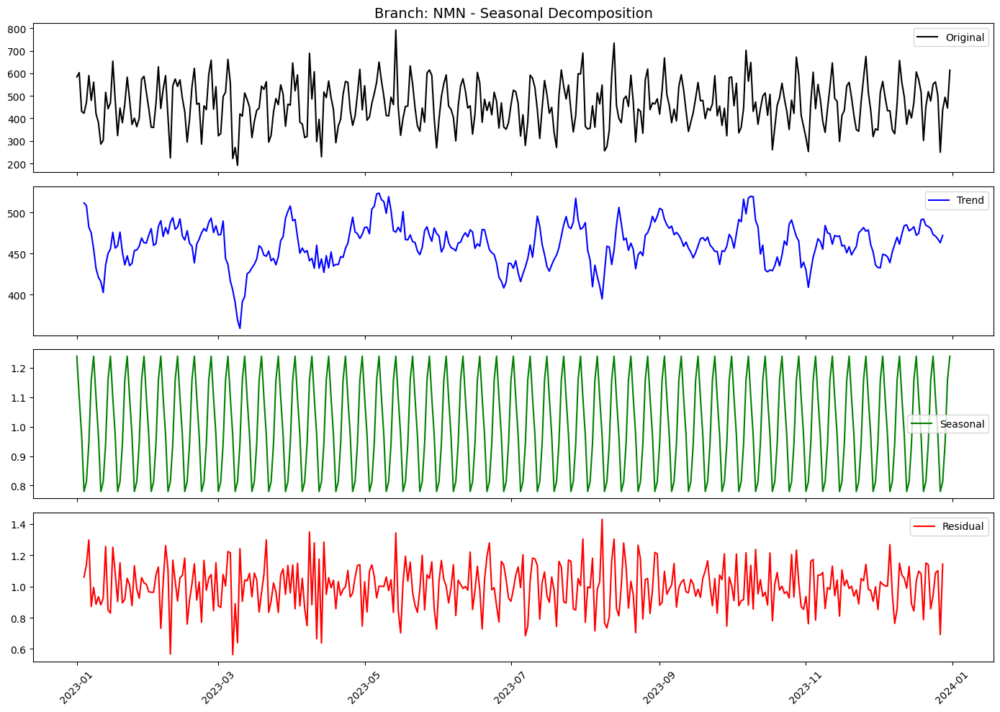

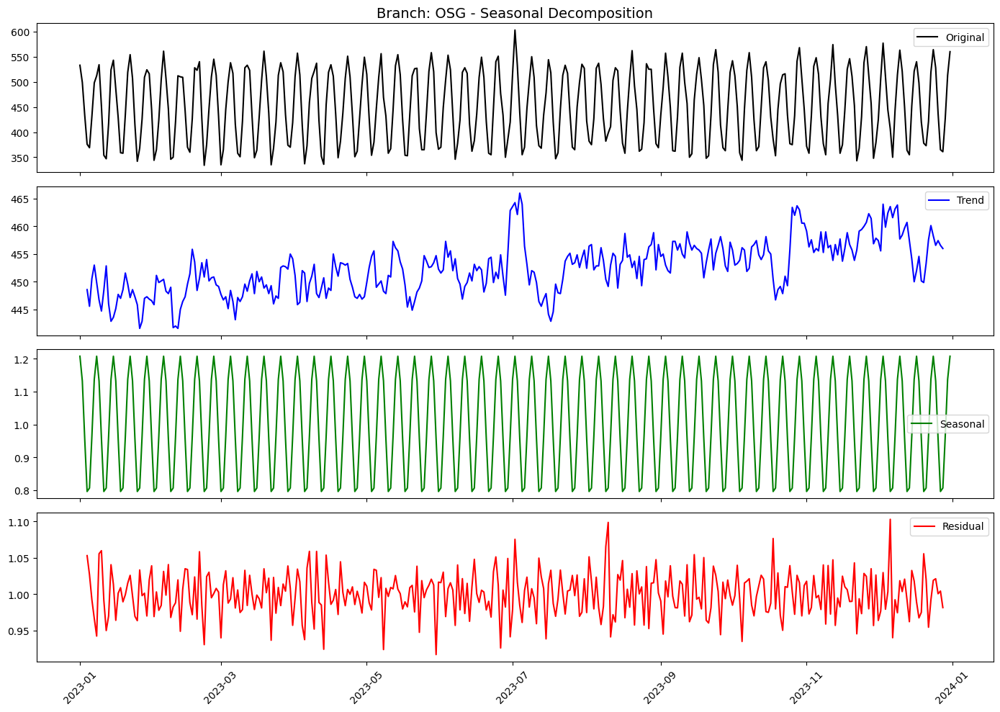

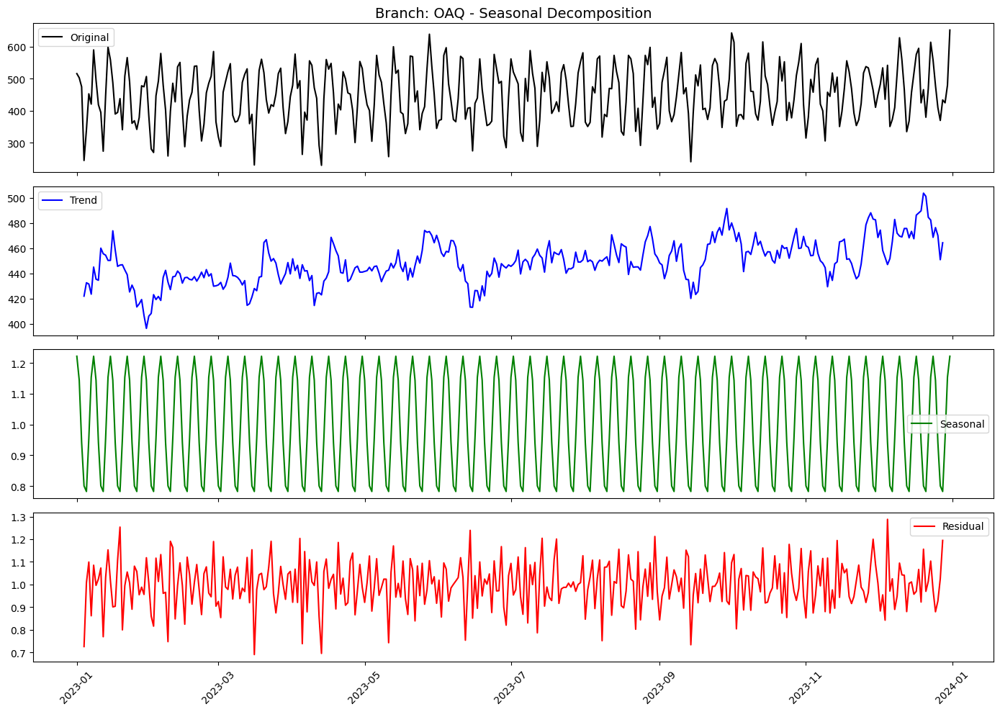

In [69]:
selected = ['NGD', 'NMN', 'OSG', 'OAQ']

for name in selected:
    result = seasonal_decompose(data[name], model='multiplicative', period=7)
    
    fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)  # Bigger figure size for clarity
    
    # Original series
    axes[0].plot(data.index, data[name], label="Original", color="black")
    axes[0].set_title(f'Branch: {name} - Seasonal Decomposition', fontsize=14)
    axes[0].legend()

    # Trend
    axes[1].plot(result.trend, label="Trend", color="blue")
    axes[1].legend()

    # Seasonal
    axes[2].plot(result.seasonal, label="Seasonal", color="green")
    axes[2].legend()

    # Residual
    axes[3].plot(result.resid, label="Residual", color="red")
    axes[3].legend()

    # Improve x-axis date visibility
    plt.xticks(rotation=45)  # Rotate labels for better visibility
    
    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()

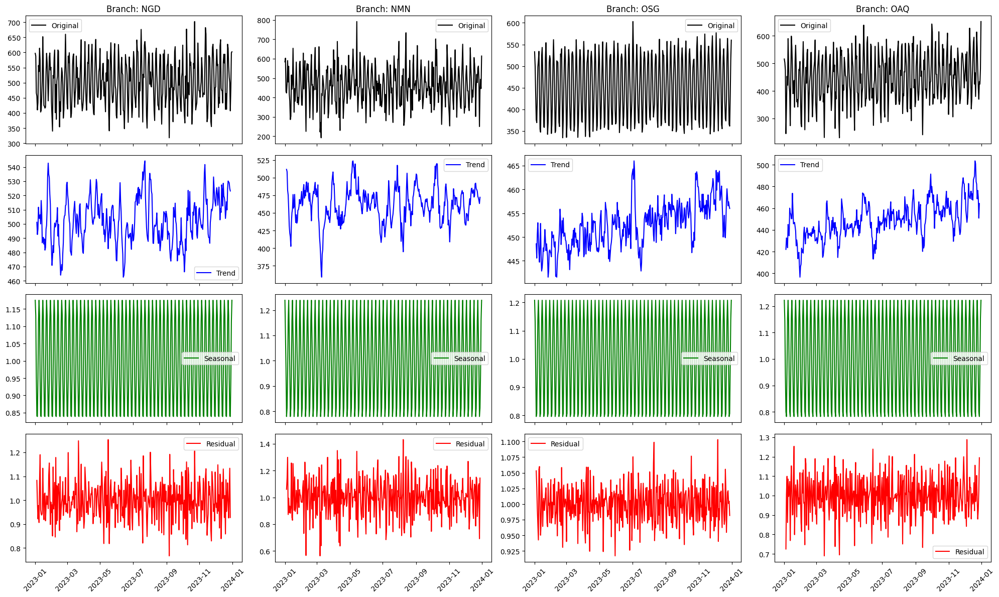

In [70]:
selected = ['NGD', 'NMN', 'OSG', 'OAQ']

fig, axes = plt.subplots(4, len(selected), figsize=(20, 12), sharex=True)  # 4 rows, len(selected) columns

for i, name in enumerate(selected):
    result = seasonal_decompose(data[name], model='multiplicative', period=7)

    # Original series
    axes[0, i].plot(data.index, data[name], label="Original", color="black")
    axes[0, i].set_title(f'Branch: {name}', fontsize=12)
    axes[0, i].legend()
    

    # Trend
    axes[1, i].plot(result.trend, label="Trend", color="blue")
    axes[1, i].legend()

    # Seasonal
    axes[2, i].plot(result.seasonal, label="Seasonal", color="green")
    axes[2, i].legend()

    # Residual
    axes[3, i].plot(result.resid, label="Residual", color="red")
    axes[3, i].legend()

    # Rotate x-ticks only on the last row (Residual)
    axes[3, i].tick_params(axis='x', rotation=45)

plt.tight_layout()  # Adjust layout to avoid overlap
plt.show()

/var/folders/1l/npl241jn2_vfgc751fqw5mfc0000gn/T/ipykernel_21136/3913252676.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Visitor_Category', y='VenueSpend', data=data_long, palette='coolwarm')


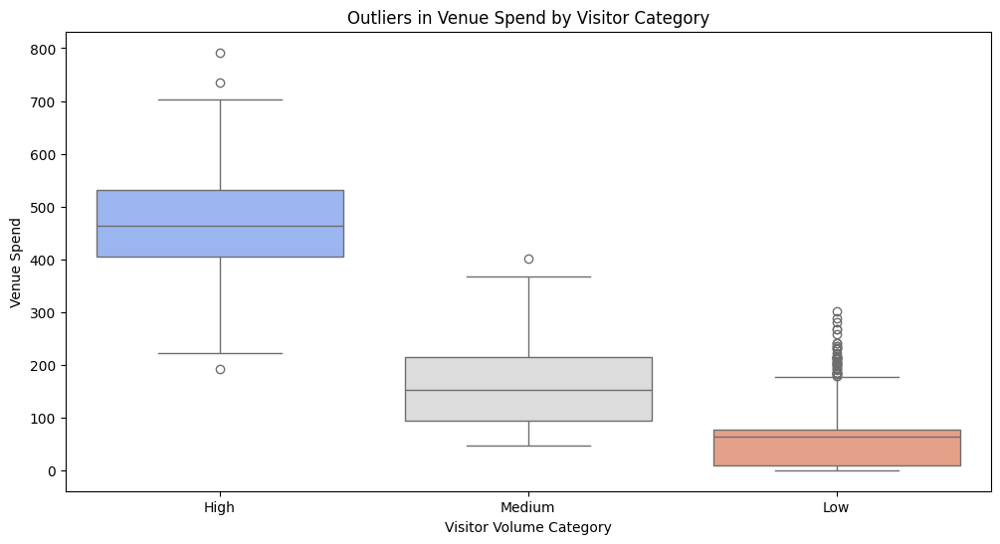

In [71]:
# Plot boxplot to identify outliers in Venue Spend
# Define segment mapping
segments = {
    'High': ['NGD', 'NMN', 'OSG', 'OAQ'],
    'Medium': ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT'],
    'Low': ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']
}

# Convert data from wide to long format
data_long = data.melt(var_name='Location', value_name='VenueSpend')

# Assign visitor categories based on location
data_long['Visitor_Category'] = data_long['Location'].map(
    {loc: 'High' for loc in segments['High']} |
    {loc: 'Medium' for loc in segments['Medium']} |
    {loc: 'Low' for loc in segments['Low']}
)

# Plot boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Visitor_Category', y='VenueSpend', data=data_long, palette='coolwarm')

# Adjust labels
plt.title("Outliers in Venue Spend by Visitor Category")
plt.xlabel('Visitor Volume Category')
plt.ylabel('Venue Spend')

plt.show()

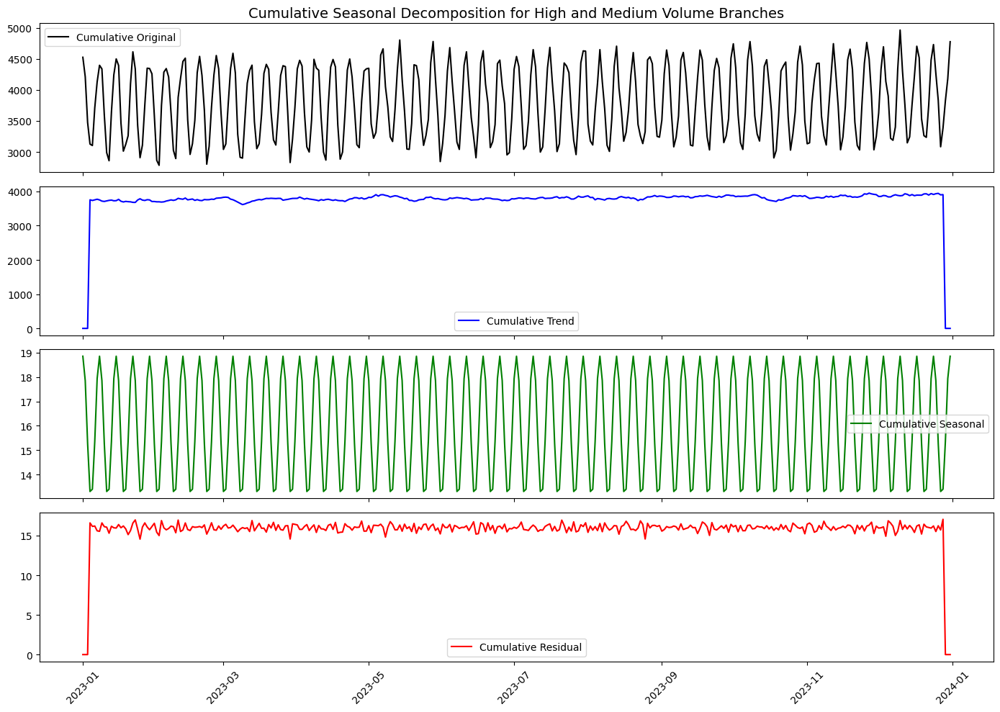

In [109]:
selected = ['NGD', 'NMN', 'OSG', 'OAQ','MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']

# Initialize cumulative components
cumulative_original = pd.Series(0, index=data.index)
cumulative_trend = pd.Series(0, index=data.index)
cumulative_seasonal = pd.Series(0, index=data.index)
cumulative_residual = pd.Series(0, index=data.index)

# Perform decomposition and sum each component
for name in selected:
    result = seasonal_decompose(data[name], model='multiplicative', period=7)
    
    cumulative_original += data[name]  # Sum original values
    cumulative_trend += result.trend.fillna(0)  # Fill NaN values to avoid issues
    cumulative_seasonal += result.seasonal
    cumulative_residual += result.resid.fillna(0)

# Create subplots
fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)

# Plot original cumulative data
axes[0].plot(data.index, cumulative_original, label="Cumulative Original", color="black")
axes[0].set_title('Cumulative Seasonal Decomposition for High and Medium Volume Branches', fontsize=14)
axes[0].legend()

# Plot cumulative trend
axes[1].plot(data.index, cumulative_trend, label="Cumulative Trend", color="blue")
axes[1].legend()

# Plot cumulative seasonal component
axes[2].plot(data.index, cumulative_seasonal, label="Cumulative Seasonal", color="green")
axes[2].legend()

# Plot cumulative residuals
axes[3].plot(data.index, cumulative_residual, label="Cumulative Residual", color="red")
axes[3].legend()

# Improve x-axis readability
plt.xticks(rotation=45)

plt.tight_layout()  # Adjust layout to avoid overlap
plt.savefig("seasonal decomp.png", dpi=300, bbox_inches="tight")

plt.show()

In [73]:
# List of index values to drop
indexes_to_drop = ['RTE', 'QHZ', 'AOJ', 'BGW', 'CUB', 'QNM', 'RBO', 'BAL', 'DGG', 'COQ', 'ZGP', 'SZY', 'RNT', 'VUV', 'TNB', 'TTL', 'SHI', 'UHQ', 'UAF']

# Create a new summary dataframe by dropping the specified rows
summary_data_cleaned = summary_data.drop(indexes_to_drop)

# Display the new summary dataframe
print(summary_data_cleaned)


     visitors_per_yr  Avg_age  max_trvl_distance  avg_visit_duration  \
NGD           183666       54                 10                  92   
NMN           168966       21                 20                  85   
OSG           165262       25                 13                 104   
OAQ           164048       50                 22                 132   
MGT            95302       45                  5                 108   
LME            87941       39                 40                 138   
NSY            85171       46                 18                  96   
MAJ            74450       47                  6                  65   
VIY            65158       36                 32                  82   
VOK            61925       37                 11                  93   
WUC            55866       34                 26                  75   
WAN            52522       34                  9                 112   
EUI            33116       28                  4                

In [74]:
summary_data.head()

,visitors_per_yr,Avg_age,max_trvl_distance,avg_visit_duration,gender_female_%,avg_spend
NGD,183666,54,10,92,42,29
NMN,168966,21,20,85,54,10
OSG,165262,25,13,104,57,14
OAQ,164048,50,22,132,53,22
MGT,95302,45,5,108,45,18


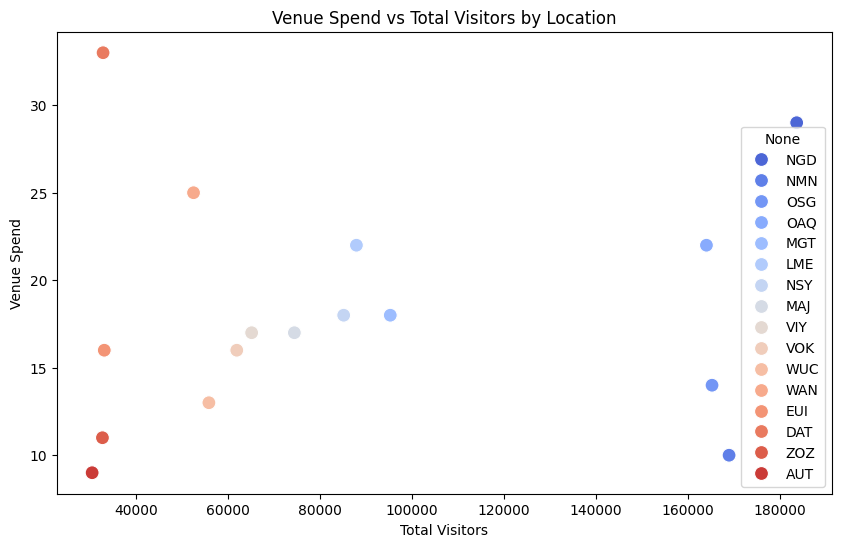

In [75]:
plt.figure(figsize=(10, 6))

# Create the scatter plot using Seaborn
sns.scatterplot(x='visitors_per_yr', y='avg_spend', hue=summary_data_cleaned.index, data=summary_data_cleaned, palette='coolwarm', s=100)

# Add labels and title
plt.title("Venue Spend vs Total Visitors by Location")
plt.xlabel('Total Visitors')
plt.ylabel('Venue Spend')

# Show the plot
plt.show()

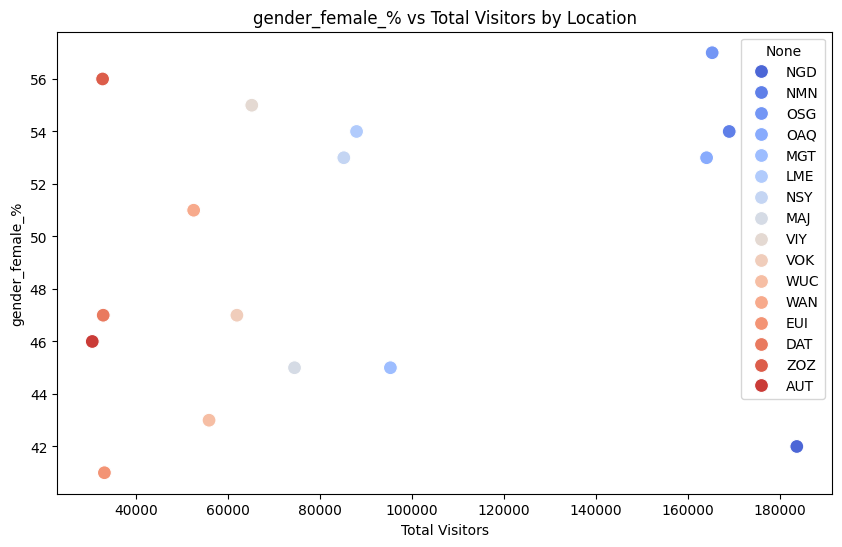

In [76]:
plt.figure(figsize=(10, 6))

# Create the scatter plot using Seaborn
sns.scatterplot(x='visitors_per_yr', y='gender_female_%', hue=summary_data_cleaned.index, data=summary_data_cleaned, palette='coolwarm', s=100)

# Add labels and title
plt.title("gender_female_% vs Total Visitors by Location")
plt.xlabel('Total Visitors')
plt.ylabel('gender_female_%')

# Show the plot
plt.show()

In [77]:
summary_data.head()

,visitors_per_yr,Avg_age,max_trvl_distance,avg_visit_duration,gender_female_%,avg_spend
NGD,183666,54,10,92,42,29
NMN,168966,21,20,85,54,10
OSG,165262,25,13,104,57,14
OAQ,164048,50,22,132,53,22
MGT,95302,45,5,108,45,18


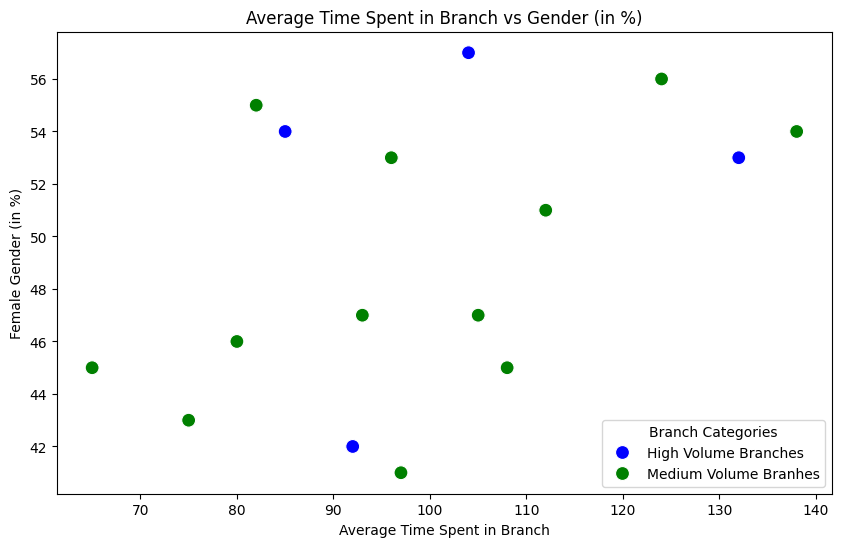

In [78]:
# Define branch categories
high_branches = ['NGD', 'NMN', 'OSG', 'OAQ']
medium_branches = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']

high_color = 'High Volume Branches'
medium_color = 'Medium Volume Branhes'

# Add a new column in the dataframe to map each branch to its corresponding color
summary_data_cleaned['branch_color'] = summary_data_cleaned.index.map(lambda x: high_color if x in high_branches else (medium_color ))


plt.figure(figsize=(10, 6))
sns.scatterplot(x='avg_visit_duration', y='gender_female_%', hue='branch_color', data=summary_data_cleaned, s=100, palette=['blue', 'green'])


plt.title("Average Time Spent in Branch vs Gender (in %)")
plt.xlabel('Average Time Spent in Branch')
plt.ylabel('Female Gender (in %)')
plt.legend(title='Branch Categories', loc='best')

plt.show()

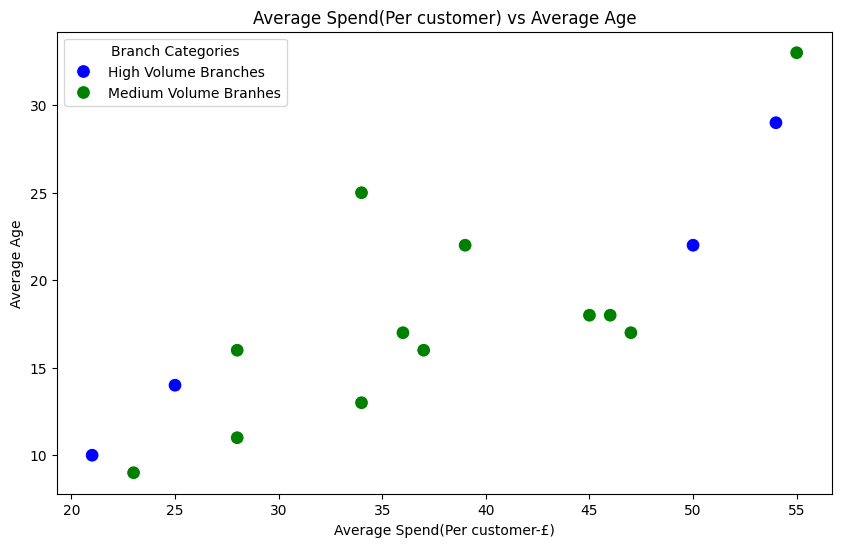

In [79]:
# Define branch categories
high_branches = ['NGD', 'NMN', 'OSG', 'OAQ']
medium_branches = ['MGT', 'LME', 'NSY', 'MAJ', 'VIY', 'VOK', 'WUC', 'WAN', 'EUI', 'DAT', 'ZOZ', 'AUT']

high_color = 'High Volume Branches'
medium_color = 'Medium Volume Branhes'

# Add a new column in the dataframe to map each branch to its corresponding color
summary_data_cleaned['branch_color'] = summary_data_cleaned.index.map(lambda x: high_color if x in high_branches else (medium_color ))


plt.figure(figsize=(10, 6))
sns.scatterplot(x='Avg_age', y='avg_spend', hue='branch_color', data=summary_data_cleaned, s=100, palette=['blue', 'green'])


plt.title("Average Spend(Per customer) vs Average Age")
plt.xlabel('Average Spend(Per customer-£)')
plt.ylabel('Average Age')
plt.legend(title='Branch Categories', loc='best')

plt.show()

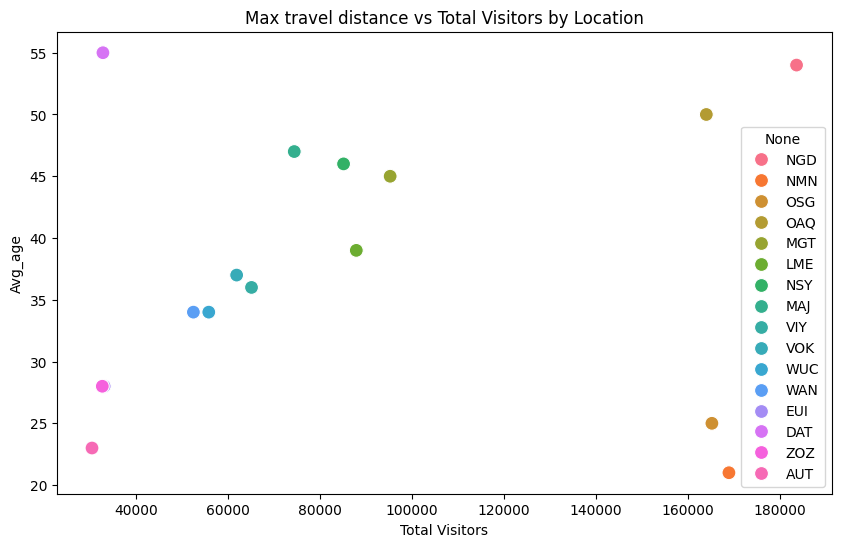

In [80]:
plt.figure(figsize=(10, 6))

# Create the scatter plot using Seaborn
sns.scatterplot(x='visitors_per_yr', y='Avg_age', hue=summary_data_cleaned.index, data=summary_data_cleaned, s=100)

# Add labels and title
plt.title("Max travel distance vs Total Visitors by Location")
plt.xlabel('Total Visitors')
plt.ylabel('Avg_age')

# Show the plot
plt.show()

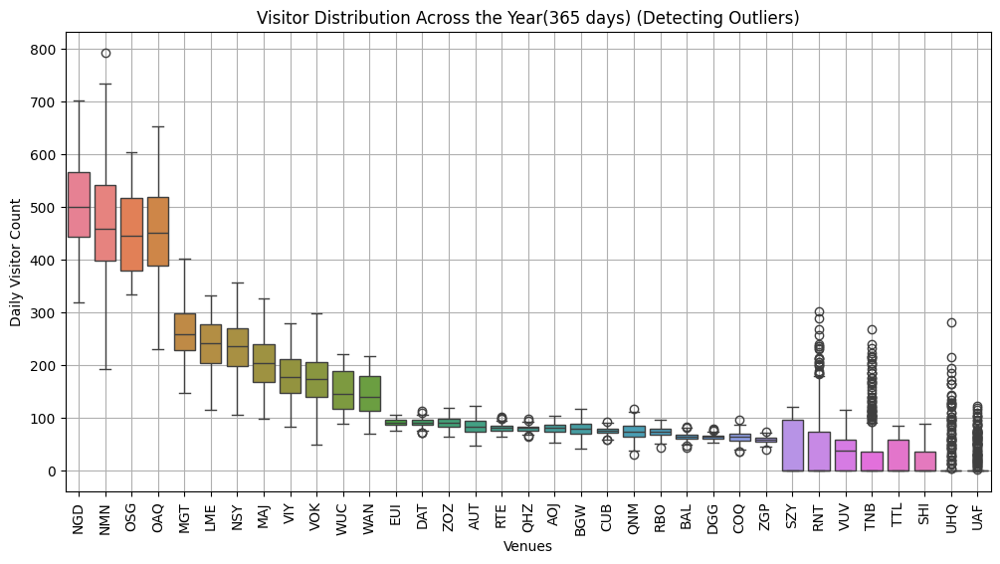

In [81]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data) 
plt.xticks(rotation=90)  
plt.xlabel("Venues")
plt.ylabel("Daily Visitor Count")
plt.title("Visitor Distribution Across the Year(365 days) (Detecting Outliers)")
plt.grid()
plt.show()
